# Air Quality Measure based on AQI

- An air quality index (AQI) is used by government agencies to communicate to the public how polluted the air currently is or how polluted it is forecast to become. Public health risks increase as the AQI rises. 

- There are six AQI categories, namely Good, Satisfactory, Moderately polluted, Poor, Very Poor, and Severe. The proposed AQI will consider eight pollutants (PM10, PM2.5, NO2, SO2, CO, O3, NH3, and Pb) for which short-term (up to 24-hourly averaging period) National Ambient Air Quality Standards are prescribed.

- Based on the measured ambient concentrations, corresponding standards and likely health impact, a sub-index is calculated for each of these pollutants. The worst sub-index reflects overall AQI. Likely health impacts for different AQI categories and pollutants have also been suggested, with primary inputs from the medical experts in the group. 

- The AQI values and corresponding ambient concentrations (health breakpoints) as well as associated likely health impacts for the identified eight pollutants are as follows:

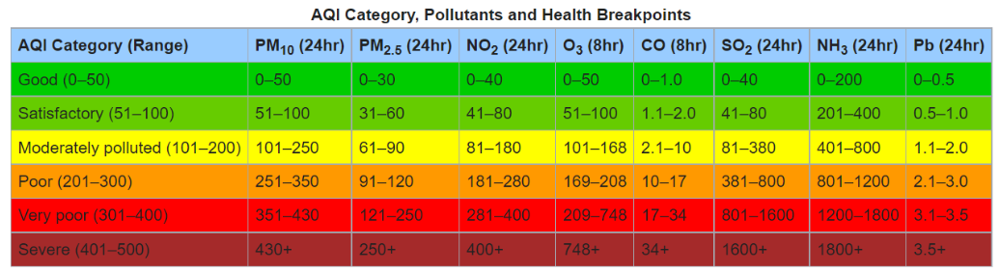

- Associated Health Impacts

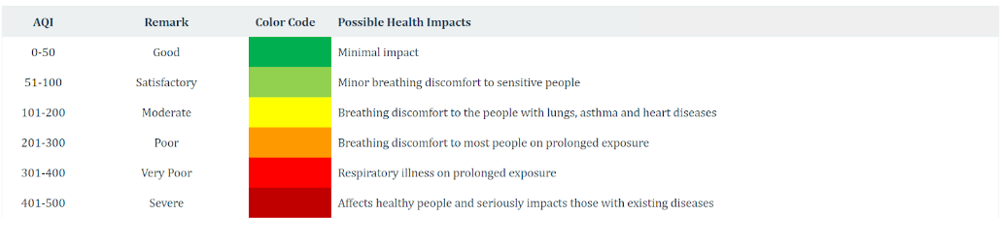

## About The Project

- In this project we mainly focused on cleaning of data and tried to interpret various conclusions and visualisations from the collected data by using various libraries.

- We tried to visualise the yearly data of every pollutant, tried to find the most polluted and the least polluted city based on the data - station wise as well as city wise.

- At last we worked on a hypothesis testing, which works around the quality of air before and after COVID-19.     


## Libraries

In [1]:
#Data Interpretation
import pandas as pd
import numpy as np
import missingno as msno
import scipy.stats as st
import cufflinks as cf

#Data Visualization
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D

#Data Statistics
from IPython.display import display_html
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from prophet import Prophet

## Data Collection

Data collected from: https://www.kaggle.com/rohanrao/air-quality-data-in-india

## Data Preprocessing and Cleaning

### Cleaning of Stations' Data to remove the missing values

In [2]:
data = pd.read_csv("stations.csv")

In [3]:
data

,StationId,StationName,City,State,Status
0,AP001,"Secretariat, Amaravati - APPCB",Amaravati,Andhra Pradesh,Active
1,AP002,"Anand Kala Kshetram, Rajamahendravaram - APPCB",Rajamahendravaram,Andhra Pradesh,NaN
2,AP003,"Tirumala, Tirupati - APPCB",Tirupati,Andhra Pradesh,NaN
3,AP004,"PWD Grounds, Vijayawada - APPCB",Vijayawada,Andhra Pradesh,NaN
4,AP005,"GVM Corporation, Visakhapatnam - APPCB",Visakhapatnam,Andhra Pradesh,Active
...,...,...,...,...,...
225,WB010,"Jadavpur, Kolkata - WBPCB",Kolkata,West Bengal,Active
226,WB011,"Rabindra Bharati University, Kolkata - WBPCB",Kolkata,West Bengal,Active
227,WB012,"Rabindra Sarobar, Kolkata - WBPCB",Kolkata,West Bengal,Active
228,WB013,"Victoria, Kolkata - WBPCB",Kolkata,West Bengal,Active


In [4]:
stations = data.dropna()

In [5]:
stations

,StationId,StationName,City,State,Status
0,AP001,"Secretariat, Amaravati - APPCB",Amaravati,Andhra Pradesh,Active
4,AP005,"GVM Corporation, Visakhapatnam - APPCB",Visakhapatnam,Andhra Pradesh,Active
5,AS001,"Railway Colony, Guwahati - APCB",Guwahati,Assam,Active
10,BR005,"DRM Office Danapur, Patna - BSPCB",Patna,Bihar,Active
11,BR006,"Govt. High School Shikarpur, Patna - BSPCB",Patna,Bihar,Active
...,...,...,...,...,...
224,WB009,"Fort William, Kolkata - WBPCB",Kolkata,West Bengal,Active
225,WB010,"Jadavpur, Kolkata - WBPCB",Kolkata,West Bengal,Active
226,WB011,"Rabindra Bharati University, Kolkata - WBPCB",Kolkata,West Bengal,Active
227,WB012,"Rabindra Sarobar, Kolkata - WBPCB",Kolkata,West Bengal,Active


In [6]:
stations.reset_index(inplace = True)

In [7]:
station_city_state = stations[['StationId','StationName','City','State']]

In [8]:
station_city_state

,StationId,StationName,City,State
0,AP001,"Secretariat, Amaravati - APPCB",Amaravati,Andhra Pradesh
1,AP005,"GVM Corporation, Visakhapatnam - APPCB",Visakhapatnam,Andhra Pradesh
2,AS001,"Railway Colony, Guwahati - APCB",Guwahati,Assam
3,BR005,"DRM Office Danapur, Patna - BSPCB",Patna,Bihar
4,BR006,"Govt. High School Shikarpur, Patna - BSPCB",Patna,Bihar
...,...,...,...,...
128,WB009,"Fort William, Kolkata - WBPCB",Kolkata,West Bengal
129,WB010,"Jadavpur, Kolkata - WBPCB",Kolkata,West Bengal
130,WB011,"Rabindra Bharati University, Kolkata - WBPCB",Kolkata,West Bengal
131,WB012,"Rabindra Sarobar, Kolkata - WBPCB",Kolkata,West Bengal


### Merging two dataframes i.e. station_day and stations on basis of StationId.

In [9]:
station_day = pd.read_csv("station_day.csv")

In [10]:
station_day

,StationId,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
0,AP001,2017-11-24,71.36,115.75,1.75,20.65,12.40,12.19,0.10,10.76,109.26,0.17,5.92,0.10,NaN,NaN
1,AP001,2017-11-25,81.40,124.50,1.44,20.50,12.08,10.72,0.12,15.24,127.09,0.20,6.50,0.06,184.0,Moderate
2,AP001,2017-11-26,78.32,129.06,1.26,26.00,14.85,10.28,0.14,26.96,117.44,0.22,7.95,0.08,197.0,Moderate
3,AP001,2017-11-27,88.76,135.32,6.60,30.85,21.77,12.91,0.11,33.59,111.81,0.29,7.63,0.12,198.0,Moderate
4,AP001,2017-11-28,64.18,104.09,2.56,28.07,17.01,11.42,0.09,19.00,138.18,0.17,5.02,0.07,188.0,Moderate
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
108030,WB013,2020-06-27,8.65,16.46,NaN,NaN,NaN,NaN,0.69,4.36,30.59,1.32,7.26,NaN,50.0,Good
108031,WB013,2020-06-28,11.80,18.47,NaN,NaN,NaN,NaN,0.68,3.49,38.95,1.42,7.92,NaN,65.0,Satisfactory
108032,WB013,2020-06-29,18.60,32.26,13.65,200.87,214.20,11.40,0.78,5.12,38.17,3.52,8.64,NaN,63.0,Satisfactory
108033,WB013,2020-06-30,16.07,39.30,7.56,29.13,36.69,29.26,0.69,5.88,29.64,1.86,8.40,NaN,57.0,Satisfactory


In [11]:
station_merged_day = pd.merge(station_city_state , station_day, on = 'StationId', how = 'inner')

In [12]:
station_merged_day

,StationId,StationName,City,State,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
0,AP001,"Secretariat, Amaravati - APPCB",Amaravati,Andhra Pradesh,2017-11-24,71.36,115.75,1.75,20.65,12.40,12.19,0.10,10.76,109.26,0.17,5.92,0.10,NaN,NaN
1,AP001,"Secretariat, Amaravati - APPCB",Amaravati,Andhra Pradesh,2017-11-25,81.40,124.50,1.44,20.50,12.08,10.72,0.12,15.24,127.09,0.20,6.50,0.06,184.0,Moderate
2,AP001,"Secretariat, Amaravati - APPCB",Amaravati,Andhra Pradesh,2017-11-26,78.32,129.06,1.26,26.00,14.85,10.28,0.14,26.96,117.44,0.22,7.95,0.08,197.0,Moderate
3,AP001,"Secretariat, Amaravati - APPCB",Amaravati,Andhra Pradesh,2017-11-27,88.76,135.32,6.60,30.85,21.77,12.91,0.11,33.59,111.81,0.29,7.63,0.12,198.0,Moderate
4,AP001,"Secretariat, Amaravati - APPCB",Amaravati,Andhra Pradesh,2017-11-28,64.18,104.09,2.56,28.07,17.01,11.42,0.09,19.00,138.18,0.17,5.02,0.07,188.0,Moderate
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
107706,WB013,"Victoria, Kolkata - WBPCB",Kolkata,West Bengal,2020-06-27,8.65,16.46,NaN,NaN,NaN,NaN,0.69,4.36,30.59,1.32,7.26,NaN,50.0,Good
107707,WB013,"Victoria, Kolkata - WBPCB",Kolkata,West Bengal,2020-06-28,11.80,18.47,NaN,NaN,NaN,NaN,0.68,3.49,38.95,1.42,7.92,NaN,65.0,Satisfactory
107708,WB013,"Victoria, Kolkata - WBPCB",Kolkata,West Bengal,2020-06-29,18.60,32.26,13.65,200.87,214.20,11.40,0.78,5.12,38.17,3.52,8.64,NaN,63.0,Satisfactory
107709,WB013,"Victoria, Kolkata - WBPCB",Kolkata,West Bengal,2020-06-30,16.07,39.30,7.56,29.13,36.69,29.26,0.69,5.88,29.64,1.86,8.40,NaN,57.0,Satisfactory


In [13]:
#For putting some upper and lower values in the empty space from the required data.
stations_update_day = station_merged_day.fillna(method="bfill", limit=1)

In [14]:
#Updating Date and column names.
stations_update_day['Date'] = pd.to_datetime(stations_update_day['Date'])
stations_update_day.rename(columns = {'AQI_Bucket':'Air_quality'}, inplace = True)

In [15]:
stations_update_day

,StationId,StationName,City,State,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,Air_quality
0,AP001,"Secretariat, Amaravati - APPCB",Amaravati,Andhra Pradesh,2017-11-24,71.36,115.75,1.75,20.65,12.40,12.19,0.10,10.76,109.26,0.17,5.92,0.10,184.0,Moderate
1,AP001,"Secretariat, Amaravati - APPCB",Amaravati,Andhra Pradesh,2017-11-25,81.40,124.50,1.44,20.50,12.08,10.72,0.12,15.24,127.09,0.20,6.50,0.06,184.0,Moderate
2,AP001,"Secretariat, Amaravati - APPCB",Amaravati,Andhra Pradesh,2017-11-26,78.32,129.06,1.26,26.00,14.85,10.28,0.14,26.96,117.44,0.22,7.95,0.08,197.0,Moderate
3,AP001,"Secretariat, Amaravati - APPCB",Amaravati,Andhra Pradesh,2017-11-27,88.76,135.32,6.60,30.85,21.77,12.91,0.11,33.59,111.81,0.29,7.63,0.12,198.0,Moderate
4,AP001,"Secretariat, Amaravati - APPCB",Amaravati,Andhra Pradesh,2017-11-28,64.18,104.09,2.56,28.07,17.01,11.42,0.09,19.00,138.18,0.17,5.02,0.07,188.0,Moderate
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
107706,WB013,"Victoria, Kolkata - WBPCB",Kolkata,West Bengal,2020-06-27,8.65,16.46,NaN,NaN,NaN,NaN,0.69,4.36,30.59,1.32,7.26,NaN,50.0,Good
107707,WB013,"Victoria, Kolkata - WBPCB",Kolkata,West Bengal,2020-06-28,11.80,18.47,13.65,200.87,214.20,11.40,0.68,3.49,38.95,1.42,7.92,NaN,65.0,Satisfactory
107708,WB013,"Victoria, Kolkata - WBPCB",Kolkata,West Bengal,2020-06-29,18.60,32.26,13.65,200.87,214.20,11.40,0.78,5.12,38.17,3.52,8.64,NaN,63.0,Satisfactory
107709,WB013,"Victoria, Kolkata - WBPCB",Kolkata,West Bengal,2020-06-30,16.07,39.30,7.56,29.13,36.69,29.26,0.69,5.88,29.64,1.86,8.40,NaN,57.0,Satisfactory


### Cleaning of Cities' Data to remove the missing values

In [16]:
city_day = pd.read_csv("city_day.csv")

In [17]:
city_day

,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
0,Ahmedabad,2015-01-01,NaN,NaN,0.92,18.22,17.15,NaN,0.92,27.64,133.36,0.00,0.02,0.00,NaN,NaN
1,Ahmedabad,2015-01-02,NaN,NaN,0.97,15.69,16.46,NaN,0.97,24.55,34.06,3.68,5.50,3.77,NaN,NaN
2,Ahmedabad,2015-01-03,NaN,NaN,17.40,19.30,29.70,NaN,17.40,29.07,30.70,6.80,16.40,2.25,NaN,NaN
3,Ahmedabad,2015-01-04,NaN,NaN,1.70,18.48,17.97,NaN,1.70,18.59,36.08,4.43,10.14,1.00,NaN,NaN
4,Ahmedabad,2015-01-05,NaN,NaN,22.10,21.42,37.76,NaN,22.10,39.33,39.31,7.01,18.89,2.78,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29526,Visakhapatnam,2020-06-27,15.02,50.94,7.68,25.06,19.54,12.47,0.47,8.55,23.30,2.24,12.07,0.73,41.0,Good
29527,Visakhapatnam,2020-06-28,24.38,74.09,3.42,26.06,16.53,11.99,0.52,12.72,30.14,0.74,2.21,0.38,70.0,Satisfactory
29528,Visakhapatnam,2020-06-29,22.91,65.73,3.45,29.53,18.33,10.71,0.48,8.42,30.96,0.01,0.01,0.00,68.0,Satisfactory
29529,Visakhapatnam,2020-06-30,16.64,49.97,4.05,29.26,18.80,10.03,0.52,9.84,28.30,0.00,0.00,0.00,54.0,Satisfactory


In [18]:
#For putting some upper and lower values in the empty space from the required data.
city_day_update = city_day.fillna(method="bfill", limit=1)

In [19]:
#Updating Date and column names.
city_day_update['Date'] = pd.to_datetime(city_day_update['Date'])
city_day_update.rename(columns = {'AQI_Bucket':'Air_quality'}, inplace = True)

In [20]:
city_day_update

,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,Air_quality
0,Ahmedabad,2015-01-01,NaN,NaN,0.92,18.22,17.15,NaN,0.92,27.64,133.36,0.00,0.02,0.00,NaN,NaN
1,Ahmedabad,2015-01-02,NaN,NaN,0.97,15.69,16.46,NaN,0.97,24.55,34.06,3.68,5.50,3.77,NaN,NaN
2,Ahmedabad,2015-01-03,NaN,NaN,17.40,19.30,29.70,NaN,17.40,29.07,30.70,6.80,16.40,2.25,NaN,NaN
3,Ahmedabad,2015-01-04,NaN,NaN,1.70,18.48,17.97,NaN,1.70,18.59,36.08,4.43,10.14,1.00,NaN,NaN
4,Ahmedabad,2015-01-05,NaN,NaN,22.10,21.42,37.76,NaN,22.10,39.33,39.31,7.01,18.89,2.78,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29526,Visakhapatnam,2020-06-27,15.02,50.94,7.68,25.06,19.54,12.47,0.47,8.55,23.30,2.24,12.07,0.73,41.0,Good
29527,Visakhapatnam,2020-06-28,24.38,74.09,3.42,26.06,16.53,11.99,0.52,12.72,30.14,0.74,2.21,0.38,70.0,Satisfactory
29528,Visakhapatnam,2020-06-29,22.91,65.73,3.45,29.53,18.33,10.71,0.48,8.42,30.96,0.01,0.01,0.00,68.0,Satisfactory
29529,Visakhapatnam,2020-06-30,16.64,49.97,4.05,29.26,18.80,10.03,0.52,9.84,28.30,0.00,0.00,0.00,54.0,Satisfactory


## Data Visualisation

### Descriptive Analysis of Stations_day

In [21]:
print(stations_update_day.shape)

(107711, 19)


#### Calculating the number of null values in each columns.

In [22]:
stations_update_day.isnull().sum()

StationId          0
StationName        0
City               0
State              0
Date               0
PM2.5          20417
PM10           41789
NO             15629
NO2            15058
NOx            14346
NH3            47245
CO             11386
SO2            23922
O3             24213
Benzene        30164
Toluene        37453
Xylene         84595
AQI            18958
Air_quality    18958
dtype: int64

**Using the missingo library for getting the visual interpretation of missing values, so that we can replace it with some other values.**

<AxesSubplot:>

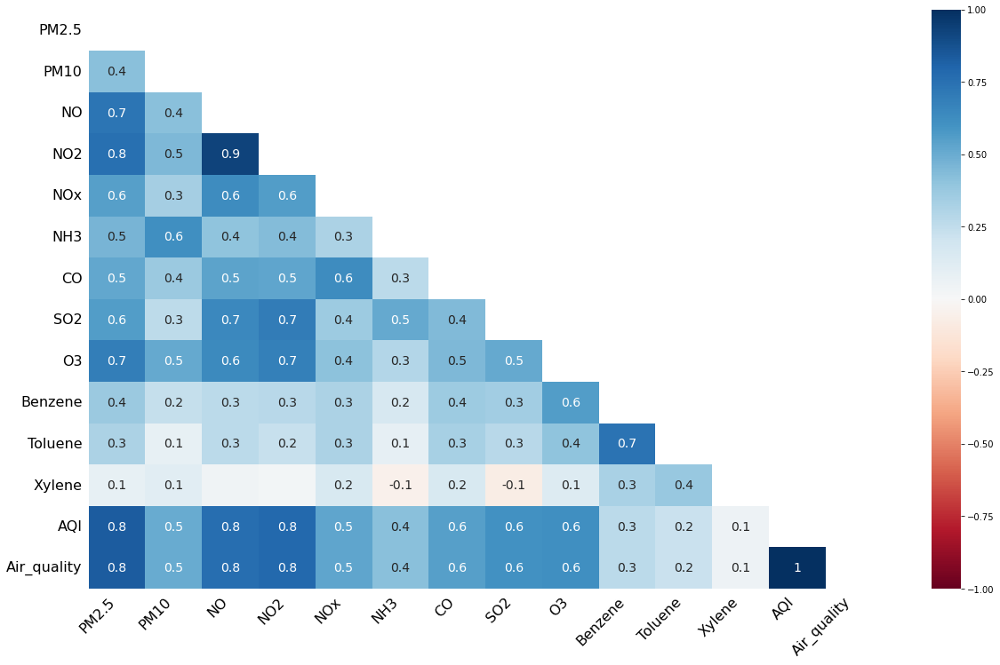

In [23]:
msno.heatmap(stations_update_day)

In [24]:
# Calculating Missing Values(Function-1).
def missing_values_table(df):
        # Total missing values
        mis_value = df.isnull().sum()
        
        # Percentage of missing values
        mis_value_percent = 100 * df.isnull().sum() / len(df)
        
        # Make a table with the results
        mis_value_table = pd.concat([mis_value, mis_value_percent], axis=1)
        
        # Rename the columns
        mis_value_table_ren_columns = mis_value_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})
        
        # Sort the table by percentage of missing descending
        mis_value_table_ren_columns = mis_value_table_ren_columns[
            mis_value_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)
        
        # Print some summary information
        print ("Your selected dataframe has " + str(df.shape[1]) + " columns.\n"      
            "There are " + str(mis_value_table_ren_columns.shape[0]) +
              " columns that have missing values.")
        
        # Return the dataframe with missing information
        return mis_value_table_ren_columns

missing_values= missing_values_table(stations_update_day)
missing_values.style.background_gradient(cmap='Reds')

Your selected dataframe has 19 columns.
There are 14 columns that have missing values.


,Missing Values,% of Total Values
Xylene,84595,78.500000
NH3,47245,43.900000
PM10,41789,38.800000
Toluene,37453,34.800000
Benzene,30164,28.000000
O3,24213,22.500000
SO2,23922,22.200000
PM2.5,20417,19.000000
AQI,18958,17.600000
Air_quality,18958,17.600000


In [25]:
stations_update_day.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 107711 entries, 0 to 107710
Data columns (total 19 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   StationId    107711 non-null  object        
 1   StationName  107711 non-null  object        
 2   City         107711 non-null  object        
 3   State        107711 non-null  object        
 4   Date         107711 non-null  datetime64[ns]
 5   PM2.5        87294 non-null   float64       
 6   PM10         65922 non-null   float64       
 7   NO           92082 non-null   float64       
 8   NO2          92653 non-null   float64       
 9   NOx          93365 non-null   float64       
 10  NH3          60466 non-null   float64       
 11  CO           96325 non-null   float64       
 12  SO2          83789 non-null   float64       
 13  O3           83498 non-null   float64       
 14  Benzene      77547 non-null   float64       
 15  Toluene      70258 non-null   floa

In [26]:
for i in stations_update_day.columns:
    print('column name:{}   unique values:{}'.format(i,len(stations_update_day[i].unique())))

column name:StationId   unique values:108
column name:StationName   unique values:108
column name:City   unique values:24
column name:State   unique values:21
column name:Date   unique values:2009
column name:PM2.5   unique values:22392
column name:PM10   unique values:29547
column name:NO   unique values:11914
column name:NO2   unique values:12051
column name:NOx   unique values:15585
column name:NH3   unique values:9112
column name:CO   unique values:2353
column name:SO2   unique values:5802
column name:O3   unique values:11161
column name:Benzene   unique values:3018
column name:Toluene   unique values:8714
column name:Xylene   unique values:1893
column name:AQI   unique values:931
column name:Air_quality   unique values:7


**Visualising the yearly data of every pollutant**

In [27]:
stations_update_day1 = stations_update_day.copy()

*We're making a column which only comprises of Benzene + Toluene + Xylene because of its same biological nature.*

In [28]:
stations_update_day1['BTX'] = stations_update_day1['Benzene']+stations_update_day1['Toluene']+stations_update_day1['Xylene']
stations_update_day1.drop(['Benzene','Toluene','Xylene'],axis=1,inplace = True);

*We're making a Patriculate_Matter only column.*

In [29]:
stations_update_day1['Particulate_Matter'] = stations_update_day1['PM2.5']+stations_update_day1['PM10']

In [30]:
stations_update_day1

,StationId,StationName,City,State,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,AQI,Air_quality,BTX,Particulate_Matter
0,AP001,"Secretariat, Amaravati - APPCB",Amaravati,Andhra Pradesh,2017-11-24,71.36,115.75,1.75,20.65,12.40,12.19,0.10,10.76,109.26,184.0,Moderate,6.19,187.11
1,AP001,"Secretariat, Amaravati - APPCB",Amaravati,Andhra Pradesh,2017-11-25,81.40,124.50,1.44,20.50,12.08,10.72,0.12,15.24,127.09,184.0,Moderate,6.76,205.90
2,AP001,"Secretariat, Amaravati - APPCB",Amaravati,Andhra Pradesh,2017-11-26,78.32,129.06,1.26,26.00,14.85,10.28,0.14,26.96,117.44,197.0,Moderate,8.25,207.38
3,AP001,"Secretariat, Amaravati - APPCB",Amaravati,Andhra Pradesh,2017-11-27,88.76,135.32,6.60,30.85,21.77,12.91,0.11,33.59,111.81,198.0,Moderate,8.04,224.08
4,AP001,"Secretariat, Amaravati - APPCB",Amaravati,Andhra Pradesh,2017-11-28,64.18,104.09,2.56,28.07,17.01,11.42,0.09,19.00,138.18,188.0,Moderate,5.26,168.27
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
107706,WB013,"Victoria, Kolkata - WBPCB",Kolkata,West Bengal,2020-06-27,8.65,16.46,NaN,NaN,NaN,NaN,0.69,4.36,30.59,50.0,Good,NaN,25.11
107707,WB013,"Victoria, Kolkata - WBPCB",Kolkata,West Bengal,2020-06-28,11.80,18.47,13.65,200.87,214.20,11.40,0.68,3.49,38.95,65.0,Satisfactory,NaN,30.27
107708,WB013,"Victoria, Kolkata - WBPCB",Kolkata,West Bengal,2020-06-29,18.60,32.26,13.65,200.87,214.20,11.40,0.78,5.12,38.17,63.0,Satisfactory,NaN,50.86
107709,WB013,"Victoria, Kolkata - WBPCB",Kolkata,West Bengal,2020-06-30,16.07,39.30,7.56,29.13,36.69,29.26,0.69,5.88,29.64,57.0,Satisfactory,NaN,55.37


In [31]:
pollutants_stations = ['PM2.5','PM10','NO','NO2','NOx','NH3','CO','SO2','O3','BTX','Particulate_Matter']

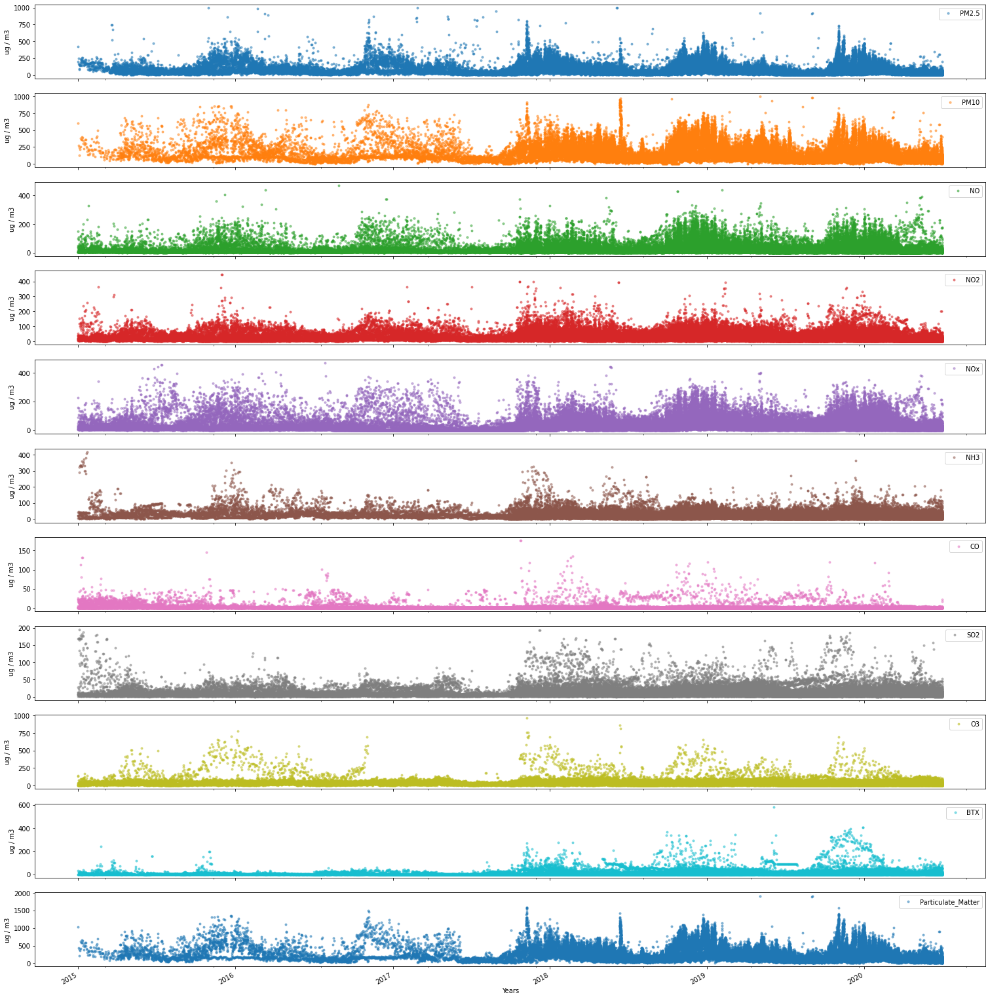

In [32]:
stations_update_day1.set_index('Date',inplace=True)
axes = stations_update_day1[pollutants_stations].plot(marker='.', alpha=0.5, linestyle='None', figsize=(26, 30), subplots=True)
for ax in axes:
    
    ax.set_xlabel('Years')
    ax.set_ylabel('ug / m3')

### Descriptive Analysis of city_day

In [33]:
print(city_day_update.shape)

(29531, 16)


#### Calculating the number of null values in each columns.

In [34]:
city_day_update.isnull().sum()

City               0
Date               0
PM2.5           4321
PM10           10866
NO              3276
NO2             3278
NOx             3980
NH3            10061
CO              1745
SO2             3510
O3              3664
Benzene         5298
Toluene         7739
Xylene         17878
AQI             4174
Air_quality     4174
dtype: int64

**Using the missingo library for getting the viusal interpretation of missing values, so that we can replace it with some other values.**

<AxesSubplot:>

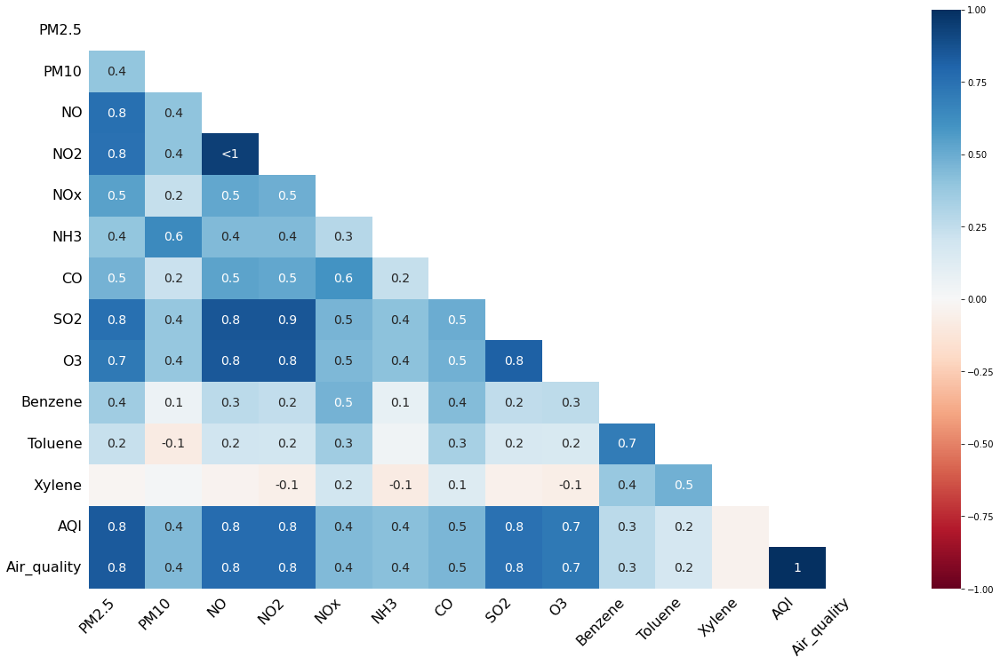

In [35]:
msno.heatmap(city_day_update)

In [36]:
# Calculating Missing Values(by help of Function - 1 created above).
missing_values_city = missing_values_table(city_day_update)
missing_values_city.style.background_gradient(cmap='Oranges')

Your selected dataframe has 16 columns.
There are 14 columns that have missing values.


,Missing Values,% of Total Values
Xylene,17878,60.500000
PM10,10866,36.800000
NH3,10061,34.100000
Toluene,7739,26.200000
Benzene,5298,17.900000
PM2.5,4321,14.600000
AQI,4174,14.100000
Air_quality,4174,14.100000
NOx,3980,13.500000
O3,3664,12.400000


In [37]:
city_day_update.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29531 entries, 0 to 29530
Data columns (total 16 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   City         29531 non-null  object        
 1   Date         29531 non-null  datetime64[ns]
 2   PM2.5        25210 non-null  float64       
 3   PM10         18665 non-null  float64       
 4   NO           26255 non-null  float64       
 5   NO2          26253 non-null  float64       
 6   NOx          25551 non-null  float64       
 7   NH3          19470 non-null  float64       
 8   CO           27786 non-null  float64       
 9   SO2          26021 non-null  float64       
 10  O3           25867 non-null  float64       
 11  Benzene      24233 non-null  float64       
 12  Toluene      21792 non-null  float64       
 13  Xylene       11653 non-null  float64       
 14  AQI          25357 non-null  float64       
 15  Air_quality  25357 non-null  object        
dtypes: d

In [38]:
for i in city_day_update.columns:
    print('column name:{}   unique values:{}'.format(i,len(city_day_update[i].unique())))

column name:City   unique values:26
column name:Date   unique values:2009
column name:PM2.5   unique values:11717
column name:PM10   unique values:12572
column name:NO   unique values:5777
column name:NO2   unique values:7405
column name:NOx   unique values:8157
column name:NH3   unique values:5923
column name:CO   unique values:1780
column name:SO2   unique values:4762
column name:O3   unique values:7700
column name:Benzene   unique values:1874
column name:Toluene   unique values:3609
column name:Xylene   unique values:1562
column name:AQI   unique values:830
column name:Air_quality   unique values:7


**Visualising the yearly data of every pollutant**

In [39]:
city_day_update1 = city_day_update.copy()

*We're making a column which only comprises of Benzene + Toluene + Xylene because of its same biological nature.*

In [40]:
city_day_update1['BTX'] = city_day_update1['Benzene']+city_day_update1['Toluene']+city_day_update1['Xylene']
city_day_update1.drop(['Benzene','Toluene','Xylene'],axis=1,inplace = True)

*We're making a Patriculate_Matter only column.*

In [41]:
city_day_update1['Particulate_Matter'] = city_day_update1['PM2.5']+city_day_update1['PM10']

In [42]:
city_day_update1

,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,AQI,Air_quality,BTX,Particulate_Matter
0,Ahmedabad,2015-01-01,NaN,NaN,0.92,18.22,17.15,NaN,0.92,27.64,133.36,NaN,NaN,0.02,NaN
1,Ahmedabad,2015-01-02,NaN,NaN,0.97,15.69,16.46,NaN,0.97,24.55,34.06,NaN,NaN,12.95,NaN
2,Ahmedabad,2015-01-03,NaN,NaN,17.40,19.30,29.70,NaN,17.40,29.07,30.70,NaN,NaN,25.45,NaN
3,Ahmedabad,2015-01-04,NaN,NaN,1.70,18.48,17.97,NaN,1.70,18.59,36.08,NaN,NaN,15.57,NaN
4,Ahmedabad,2015-01-05,NaN,NaN,22.10,21.42,37.76,NaN,22.10,39.33,39.31,NaN,NaN,28.68,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29526,Visakhapatnam,2020-06-27,15.02,50.94,7.68,25.06,19.54,12.47,0.47,8.55,23.30,41.0,Good,15.04,65.96
29527,Visakhapatnam,2020-06-28,24.38,74.09,3.42,26.06,16.53,11.99,0.52,12.72,30.14,70.0,Satisfactory,3.33,98.47
29528,Visakhapatnam,2020-06-29,22.91,65.73,3.45,29.53,18.33,10.71,0.48,8.42,30.96,68.0,Satisfactory,0.02,88.64
29529,Visakhapatnam,2020-06-30,16.64,49.97,4.05,29.26,18.80,10.03,0.52,9.84,28.30,54.0,Satisfactory,0.00,66.61


In [43]:
pollutants_city = ['PM2.5','PM10','NO','NO2','NOx','NH3','CO','SO2','O3','BTX','Particulate_Matter']

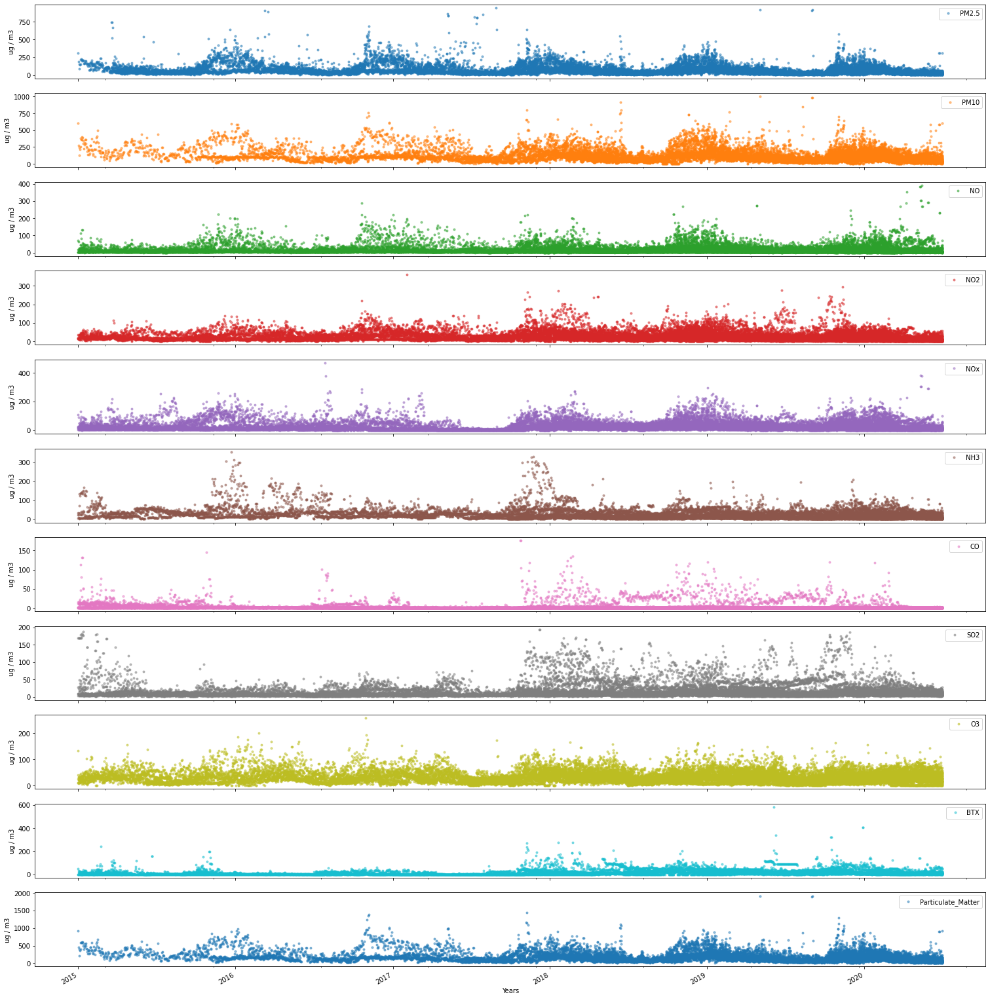

In [44]:
city_day_update1.set_index('Date',inplace=True)
axes = city_day_update1[pollutants_city].plot(marker='.', alpha=0.5, linestyle='None', figsize=(26, 30), subplots=True)
for ax in axes:
    
    ax.set_xlabel('Years')
    ax.set_ylabel('ug / m3')

## Data Statistics

### Most and Least Polluted Stations based on the given dataset

#### Most Polluted

In [45]:
stations_update_day1

,StationId,StationName,City,State,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,AQI,Air_quality,BTX,Particulate_Matter
Date,,,,,,,,,,,,,,,,,
2017-11-24,AP001,"Secretariat, Amaravati - APPCB",Amaravati,Andhra Pradesh,71.36,115.75,1.75,20.65,12.40,12.19,0.10,10.76,109.26,184.0,Moderate,6.19,187.11
2017-11-25,AP001,"Secretariat, Amaravati - APPCB",Amaravati,Andhra Pradesh,81.40,124.50,1.44,20.50,12.08,10.72,0.12,15.24,127.09,184.0,Moderate,6.76,205.90
2017-11-26,AP001,"Secretariat, Amaravati - APPCB",Amaravati,Andhra Pradesh,78.32,129.06,1.26,26.00,14.85,10.28,0.14,26.96,117.44,197.0,Moderate,8.25,207.38
2017-11-27,AP001,"Secretariat, Amaravati - APPCB",Amaravati,Andhra Pradesh,88.76,135.32,6.60,30.85,21.77,12.91,0.11,33.59,111.81,198.0,Moderate,8.04,224.08
2017-11-28,AP001,"Secretariat, Amaravati - APPCB",Amaravati,Andhra Pradesh,64.18,104.09,2.56,28.07,17.01,11.42,0.09,19.00,138.18,188.0,Moderate,5.26,168.27
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-06-27,WB013,"Victoria, Kolkata - WBPCB",Kolkata,West Bengal,8.65,16.46,NaN,NaN,NaN,NaN,0.69,4.36,30.59,50.0,Good,NaN,25.11
2020-06-28,WB013,"Victoria, Kolkata - WBPCB",Kolkata,West Bengal,11.80,18.47,13.65,200.87,214.20,11.40,0.68,3.49,38.95,65.0,Satisfactory,NaN,30.27
2020-06-29,WB013,"Victoria, Kolkata - WBPCB",Kolkata,West Bengal,18.60,32.26,13.65,200.87,214.20,11.40,0.78,5.12,38.17,63.0,Satisfactory,NaN,50.86


In [46]:
#Function for printing Most polluted stations.
def max_polluted_stn(pollutants_stations):
    x1 = stations_update_day1[[pollutants_stations,'StationName','City']].groupby(["StationName"]).mean().sort_values(by=pollutants_stations,ascending=False).reset_index()
    x1[pollutants_stations] = round(x1[pollutants_stations],2)
    return x1[:10].style.background_gradient(cmap='OrRd')

In [47]:
#For printing the table side by side.
#Source - https://stackoverflow.com/questions/38783027/jupyter-notebook-display-two-pandas-tables-side-by-side
def display_side_by_side(*args):
    html_str=''
    for df in args:
        html_str+=df.render()
    display_html(html_str.replace('table','table style="display:inline"'),raw=True)

In [48]:
pm2_5 = max_polluted_stn('PM2.5')
pm10 = max_polluted_stn('PM10')
Particulate_Matter = max_polluted_stn('Particulate_Matter')
no = max_polluted_stn('NO')
no2 = max_polluted_stn('NO2')
nox = max_polluted_stn('NOx')
nh3 = max_polluted_stn('NH3')
co = max_polluted_stn('CO')
so2 = max_polluted_stn('SO2')
o3 = max_polluted_stn('O3')
btx = max_polluted_stn('BTX')
display_side_by_side(pm2_5,pm10,Particulate_Matter,no,no2,nox,nh3,co,so2,o3,btx)

,StationName,PM2.5
0,"Anand Vihar, Delhi - DPCC",152.350000
1,"Talkatora District Industries Center, Lucknow - CPCB",134.690000
2,"DTU, Delhi - CPCB",131.080000
3,"IGSC Planetarium Complex, Patna - BSPCB",130.450000
4,"Jahangirpuri, Delhi - DPCC",128.120000
5,"Wazirpur, Delhi - DPCC",127.510000
6,"Mundka, Delhi - DPCC",122.460000
7,"Rohini, Delhi - DPCC",122.420000
8,"Bawana, Delhi - DPCC",120.950000
9,"Burari Crossing, Delhi - IMD",120.820000


#### Least Polluted

In [49]:
#Function for printing Least polluted stations.
def min_polluted_stn(pollutants_stations):
    x1 = stations_update_day1[[pollutants_stations,'StationName','City']].groupby(["StationName"]).mean().sort_values(by=pollutants_stations,ascending=True).reset_index()
    x1[pollutants_stations] = round(x1[pollutants_stations],2)
    return x1[:10].style.background_gradient(cmap='GnBu')

In [50]:
#For printing the table side by side.
#Source - https://stackoverflow.com/questions/38783027/jupyter-notebook-display-two-pandas-tables-side-by-side
def display_side_by_side(*args):
    html_str=''
    for df in args:
        html_str+=df.render()
    display_html(html_str.replace('table','table style="display:inline"'),raw=True)

In [51]:
pm2_5 = min_polluted_stn('PM2.5')
pm10 = min_polluted_stn('PM10')
Particulate_Matter = min_polluted_stn('Particulate_Matter')
no = min_polluted_stn('NO')
no2 = min_polluted_stn('NO2')
nox = min_polluted_stn('NOx')
nh3 = min_polluted_stn('NH3')
co = min_polluted_stn('CO')
so2 = min_polluted_stn('SO2')
o3 = min_polluted_stn('O3')
btx = min_polluted_stn('BTX')
display_side_by_side(pm2_5,pm10,Particulate_Matter,no,no2,nox,nh3,co,so2,o3,btx)

,StationName,PM2.5
0,"City Railway Station, Bengaluru - KSPCB",9.000000
1,"East Arjun Nagar, Delhi - CPCB",11.110000
2,"Sikulpuikawn, Aizawl - Mizoram PCB",16.850000
3,"Manali Village, Chennai - TNPCB",24.480000
4,"Plammoodu, Thiruvananthapuram - Kerala PCB",27.220000
5,"Hombegowda Nagar, Bengaluru - KSPCB",27.520000
6,"Hebbal, Bengaluru - KSPCB",28.930000
7,"Kariavattom, Thiruvananthapuram - Kerala PCB",28.980000
8,"SIDCO Kurichi, Coimbatore - TNPCB",29.090000
9,"Borivali East, Mumbai - MPCB",29.290000


### Most and Least Polluted Cities based on the given dataset

In [52]:
pollutants_city2 = ['PM2.5','PM10','NO','NO2','NOx','NH3','CO','SO2','O3','BTX']

#### Most Polluted

In [53]:
#Function for printing Most polluted stations.
def max_polluted_city(pollutants_city2):
    x1 = city_day_update1[[pollutants_city2,'City']].groupby(["City"]).mean().sort_values(by=pollutants_city2,ascending=False).reset_index()
    x1[pollutants_city2] = round(x1[pollutants_city2],2)
    return x1[:10].style.background_gradient(cmap='OrRd')

In [54]:
#For printing the table side by side.
#Source - https://stackoverflow.com/questions/38783027/jupyter-notebook-display-two-pandas-tables-side-by-side
def display_side_by_side(*args):
    html_str=''
    for df in args:
        html_str+=df.render()
    display_html(html_str.replace('table','table style="display:inline"'),raw=True)

In [55]:
pm2_5 = max_polluted_city('PM2.5')
pm10 = max_polluted_city('PM10')
no = max_polluted_city('NO')
no2 = max_polluted_city('NO2')
nox = max_polluted_city('NOx')
nh3 = max_polluted_city('NH3')
co = max_polluted_city('CO')
so2 = max_polluted_city('SO2')
o3 = max_polluted_city('O3')
btx = max_polluted_city('BTX')
display_side_by_side(pm2_5,pm10,no,no2,nox,nh3,co,so2,o3,btx)

,City,PM2.5
0,Patna,123.110000
1,Gurugram,117.340000
2,Delhi,117.150000
3,Lucknow,109.940000
4,Ahmedabad,67.820000
5,Jorapokhar,64.670000
6,Brajrajnagar,64.360000
7,Kolkata,64.120000
8,Guwahati,63.940000
9,Talcher,61.010000


#### Least Polluted

In [56]:
#Function for printing Least polluted stations.
def min_polluted_city(pollutants_city2):
    x1 = city_day_update1[[pollutants_city2,'City']].groupby(["City"]).mean().sort_values(by=pollutants_city2,ascending=True).reset_index()
    x1[pollutants_city2] = round(x1[pollutants_city2],2)
    return x1[:10].style.background_gradient(cmap='GnBu')

In [57]:
#For printing the table side by side.
#Source - https://stackoverflow.com/questions/38783027/jupyter-notebook-display-two-pandas-tables-side-by-side
def display_side_by_side(*args):
    html_str=''
    for df in args:
        html_str+=df.render()
    display_html(html_str.replace('table','table style="display:inline"'),raw=True)

In [58]:
pm2_5 = min_polluted_city('PM2.5')
pm10 = min_polluted_city('PM10')
no = min_polluted_city('NO')
no2 = min_polluted_city('NO2')
nox = min_polluted_city('NOx')
nh3 = min_polluted_city('NH3')
co = min_polluted_city('CO')
so2 = min_polluted_city('SO2')
o3 = min_polluted_city('O3')
btx = min_polluted_city('BTX')
display_side_by_side(pm2_5,pm10,no,no2,nox,nh3,co,so2,o3,btx)

,City,PM2.5
0,Aizawl,16.850000
1,Ernakulam,24.960000
2,Thiruvananthapuram,27.990000
3,Coimbatore,29.730000
4,Shillong,30.290000
5,Kochi,31.430000
6,Mumbai,35.260000
7,Bengaluru,36.090000
8,Amaravati,37.640000
9,Chandigarh,41.060000


### Data Interpretation

### Stations

***Filling the missing values with the help of median of each column.***

In [59]:
stations_update_day

,StationId,StationName,City,State,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,Air_quality
0,AP001,"Secretariat, Amaravati - APPCB",Amaravati,Andhra Pradesh,2017-11-24,71.36,115.75,1.75,20.65,12.40,12.19,0.10,10.76,109.26,0.17,5.92,0.10,184.0,Moderate
1,AP001,"Secretariat, Amaravati - APPCB",Amaravati,Andhra Pradesh,2017-11-25,81.40,124.50,1.44,20.50,12.08,10.72,0.12,15.24,127.09,0.20,6.50,0.06,184.0,Moderate
2,AP001,"Secretariat, Amaravati - APPCB",Amaravati,Andhra Pradesh,2017-11-26,78.32,129.06,1.26,26.00,14.85,10.28,0.14,26.96,117.44,0.22,7.95,0.08,197.0,Moderate
3,AP001,"Secretariat, Amaravati - APPCB",Amaravati,Andhra Pradesh,2017-11-27,88.76,135.32,6.60,30.85,21.77,12.91,0.11,33.59,111.81,0.29,7.63,0.12,198.0,Moderate
4,AP001,"Secretariat, Amaravati - APPCB",Amaravati,Andhra Pradesh,2017-11-28,64.18,104.09,2.56,28.07,17.01,11.42,0.09,19.00,138.18,0.17,5.02,0.07,188.0,Moderate
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
107706,WB013,"Victoria, Kolkata - WBPCB",Kolkata,West Bengal,2020-06-27,8.65,16.46,NaN,NaN,NaN,NaN,0.69,4.36,30.59,1.32,7.26,NaN,50.0,Good
107707,WB013,"Victoria, Kolkata - WBPCB",Kolkata,West Bengal,2020-06-28,11.80,18.47,13.65,200.87,214.20,11.40,0.68,3.49,38.95,1.42,7.92,NaN,65.0,Satisfactory
107708,WB013,"Victoria, Kolkata - WBPCB",Kolkata,West Bengal,2020-06-29,18.60,32.26,13.65,200.87,214.20,11.40,0.78,5.12,38.17,3.52,8.64,NaN,63.0,Satisfactory
107709,WB013,"Victoria, Kolkata - WBPCB",Kolkata,West Bengal,2020-06-30,16.07,39.30,7.56,29.13,36.69,29.26,0.69,5.88,29.64,1.86,8.40,NaN,57.0,Satisfactory


In [60]:
stations_update_day.isnull().sum()

StationId          0
StationName        0
City               0
State              0
Date               0
PM2.5          20417
PM10           41789
NO             15629
NO2            15058
NOx            14346
NH3            47245
CO             11386
SO2            23922
O3             24213
Benzene        30164
Toluene        37453
Xylene         84595
AQI            18958
Air_quality    18958
dtype: int64

In [61]:
stations_update_day.describe()

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI
count,87294.000000,65922.000000,92082.000000,92653.000000,93365.000000,60466.000000,96325.000000,83789.000000,83498.000000,77547.000000,70258.000000,23116.000000,88753.000000
mean,80.344685,158.258377,23.065599,35.362506,41.214568,28.824049,1.628631,12.300694,38.221072,3.383664,15.552798,2.458169,179.803004
std,76.654693,123.416377,34.558080,29.746311,45.315124,24.998420,4.488459,13.196388,39.240139,11.300496,29.826612,6.734150,131.420900
min,0.020000,0.010000,0.010000,0.010000,0.000000,0.010000,0.000000,0.010000,0.010000,0.000000,0.000000,0.000000,8.000000
25%,31.940000,70.490000,4.822500,15.130000,13.960000,11.930000,0.530000,5.040000,18.930000,0.160000,0.710000,0.000000,86.000000
50%,56.010000,122.490000,10.270000,27.250000,26.620000,23.650000,0.910000,8.930000,30.880000,1.210000,4.380000,0.400000,133.000000
75%,100.000000,208.967500,24.840000,47.030000,50.400000,38.200000,1.450000,14.900000,47.220000,3.610000,17.620000,2.120000,254.000000
max,1000.000000,1000.000000,470.000000,448.050000,467.630000,418.900000,175.810000,195.650000,963.000000,455.030000,454.850000,170.370000,2049.000000


In [62]:
#Replacing nullspaces with median values.
stations_update_day['PM2.5']=stations_update_day['PM2.5'].fillna(stations_update_day['PM2.5'].median())

stations_update_day['PM10']=stations_update_day['PM10'].fillna(stations_update_day['PM10'].median())

stations_update_day['NO']=stations_update_day['NO'].fillna(stations_update_day['NO'].median())

stations_update_day['NO2']=stations_update_day['NO2'].fillna(stations_update_day['NO2'].median())

stations_update_day['NOx']=stations_update_day['NOx'].fillna(stations_update_day['NOx'].median())

stations_update_day['NH3']=stations_update_day['NH3'].fillna(stations_update_day['NH3'].median())

stations_update_day['CO']=stations_update_day['CO'].fillna(stations_update_day['CO'].median())

stations_update_day['SO2']=stations_update_day['SO2'].fillna(stations_update_day['SO2'].median())

stations_update_day['O3']=stations_update_day['O3'].fillna(stations_update_day['O3'].median())

stations_update_day['Benzene']=stations_update_day['Benzene'].fillna(stations_update_day['Benzene'].median())

stations_update_day['Toluene']=stations_update_day['Toluene'].fillna(stations_update_day['Toluene'].median())

stations_update_day['Xylene']=stations_update_day['Xylene'].fillna(stations_update_day['Xylene'].median())

stations_update_day['AQI']=stations_update_day['AQI'].fillna(stations_update_day['AQI'].median())

stations_update_day['Air_quality']=stations_update_day['Air_quality'].fillna('Moderate')

#### Replacing zeroes with median values.

In [63]:
#Counting Number of zeroes.
(stations_update_day== 0).sum(axis=0)

StationId          0
StationName        0
City               0
State              0
Date               0
PM2.5              0
PM10               0
NO                 0
NO2                0
NOx             4878
NH3                0
CO              7484
SO2                0
O3                 0
Benzene        12876
Toluene        10550
Xylene          6146
AQI                0
Air_quality        0
dtype: int64

In [64]:
#Replacing zeroes with medians.
stations_update_day['PM2.5']=stations_update_day['PM2.5'].replace(0,stations_update_day['PM2.5'].median())

stations_update_day['PM10']=stations_update_day['PM10'].replace(0,stations_update_day['PM10'].median())

stations_update_day['NO']=stations_update_day['NO'].replace(0,stations_update_day['NO'].median())

stations_update_day['NO2']=stations_update_day['NO2'].replace(0,stations_update_day['NO2'].median())

stations_update_day['NOx']=stations_update_day['NOx'].replace(0,stations_update_day['NOx'].median())

stations_update_day['NH3']=stations_update_day['NH3'].replace(0,stations_update_day['NH3'].median())

stations_update_day['CO']=stations_update_day['CO'].replace(0,stations_update_day['CO'].median())

stations_update_day['SO2']=stations_update_day['SO2'].replace(0,stations_update_day['SO2'].median())

stations_update_day['O3']=stations_update_day['O3'].replace(0,stations_update_day['O3'].median())

stations_update_day['Benzene']=stations_update_day['Benzene'].replace(0,stations_update_day['Benzene'].median())

stations_update_day['Toluene']=stations_update_day['Toluene'].replace(0,stations_update_day['Toluene'].median())

stations_update_day['Xylene']=stations_update_day['Xylene'].replace(0,stations_update_day['Xylene'].median())

**Checking the data via various methods for final visualisation**

In [65]:
(stations_update_day== 0).sum(axis=0)

StationId      0
StationName    0
City           0
State          0
Date           0
PM2.5          0
PM10           0
NO             0
NO2            0
NOx            0
NH3            0
CO             0
SO2            0
O3             0
Benzene        0
Toluene        0
Xylene         0
AQI            0
Air_quality    0
dtype: int64

In [66]:
stations_update_day.isnull().sum()

StationId      0
StationName    0
City           0
State          0
Date           0
PM2.5          0
PM10           0
NO             0
NO2            0
NOx            0
NH3            0
CO             0
SO2            0
O3             0
Benzene        0
Toluene        0
Xylene         0
AQI            0
Air_quality    0
dtype: int64

In [67]:
stations_update_day.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 107711 entries, 0 to 107710
Data columns (total 19 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   StationId    107711 non-null  object        
 1   StationName  107711 non-null  object        
 2   City         107711 non-null  object        
 3   State        107711 non-null  object        
 4   Date         107711 non-null  datetime64[ns]
 5   PM2.5        107711 non-null  float64       
 6   PM10         107711 non-null  float64       
 7   NO           107711 non-null  float64       
 8   NO2          107711 non-null  float64       
 9   NOx          107711 non-null  float64       
 10  NH3          107711 non-null  float64       
 11  CO           107711 non-null  float64       
 12  SO2          107711 non-null  float64       
 13  O3           107711 non-null  float64       
 14  Benzene      107711 non-null  float64       
 15  Toluene      107711 non-null  floa

In [68]:
stations_update_day.describe()

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI
count,107711.000000,107711.000000,107711.000000,107711.000000,107711.000000,107711.000000,107711.000000,107711.000000,107711.000000,107711.000000,107711.000000,107711.000000,107711.000000
mean,75.731960,144.381199,21.208942,34.228378,40.476284,26.554569,1.615894,11.552082,36.570829,2.919585,12.096830,0.864530,171.565300
std,69.664187,98.111580,32.268880,27.731846,41.719310,18.905102,4.233512,11.723084,34.684843,9.604304,24.500655,3.227418,120.620077
min,0.020000,0.010000,0.010000,0.010000,0.010000,0.010000,0.010000,0.010000,0.010000,0.010000,0.010000,0.010000,8.000000
25%,37.100000,101.960000,5.660000,16.930000,18.230000,21.050000,0.690000,6.080000,22.390000,1.210000,4.380000,0.400000,95.000000
50%,56.010000,122.490000,10.270000,27.250000,26.620000,23.650000,0.910000,8.930000,30.880000,1.210000,4.380000,0.400000,133.000000
75%,84.700000,146.915000,21.010000,42.770000,45.380000,26.330000,1.360000,12.670000,41.440000,2.410000,8.200000,0.400000,216.000000
max,1000.000000,1000.000000,470.000000,448.050000,467.630000,418.900000,175.810000,195.650000,963.000000,455.030000,454.850000,170.370000,2049.000000


In [69]:
stations_update_day2 = stations_update_day.copy()

In [70]:
stations_update_day2['StationName'].unique()

array(['Secretariat, Amaravati - APPCB',
       'GVM Corporation, Visakhapatnam - APPCB',
       'Railway Colony, Guwahati - APCB',
       'DRM Office Danapur, Patna - BSPCB',
       'Govt. High School Shikarpur, Patna - BSPCB',
       'IGSC Planetarium Complex, Patna - BSPCB',
       'Muradpur, Patna - BSPCB', 'Rajbansi Nagar, Patna - BSPCB',
       'Samanpura, Patna - BSPCB', 'Sector-25, Chandigarh - CPCC',
       'Alipur, Delhi - DPCC', 'Anand Vihar, Delhi - DPCC',
       'Ashok Vihar, Delhi - DPCC', 'Aya Nagar, Delhi - IMD',
       'Bawana, Delhi - DPCC', 'Burari Crossing, Delhi - IMD',
       'CRRI Mathura Road, Delhi - IMD', 'DTU, Delhi - CPCB',
       'Dr. Karni Singh Shooting Range, Delhi - DPCC',
       'Dwarka-Sector 8, Delhi - DPCC', 'East Arjun Nagar, Delhi - CPCB',
       'IGI Airport (T3), Delhi - IMD',
       'IHBAS, Dilshad Garden, Delhi - CPCB', 'ITO, Delhi - CPCB',
       'Jahangirpuri, Delhi - DPCC',
       'Jawaharlal Nehru Stadium, Delhi - DPCC',
       'Lodhi Road

In [71]:
stations_update_day2['StationName'].value_counts()

IHBAS, Dilshad Garden, Delhi - CPCB           2009
Manali, Chennai - CPCB                        2009
NSIT Dwarka, Delhi - CPCB                     2009
Bandra, Mumbai - MPCB                         2009
Maninagar, Ahmedabad - GPCB                   2009
                                              ... 
DRM Office Danapur, Patna - BSPCB              126
Govt. High School Shikarpur, Patna - BSPCB     121
Teri Gram, Gurugram - HSPCB                    119
Sector-51, Gurugram - HSPCB                    119
Sikulpuikawn, Aizawl - Mizoram PCB             113
Name: StationName, Length: 108, dtype: int64

In [72]:
stations_update_day2['Pollution content'] = stations_update_day2['PM2.5']+stations_update_day2['PM10']+stations_update_day2['NO']+stations_update_day2['NO2']+stations_update_day2['NOx']+stations_update_day2['NH3']+stations_update_day2['CO']+stations_update_day2['SO2']+stations_update_day2['O3']+stations_update_day2['Benzene']+stations_update_day2['Toluene']+stations_update_day2['Xylene']

In [73]:
stations_update_day2

,StationId,StationName,City,State,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,Air_quality,Pollution content
0,AP001,"Secretariat, Amaravati - APPCB",Amaravati,Andhra Pradesh,2017-11-24,71.36,115.75,1.75,20.65,12.40,12.19,0.10,10.76,109.26,0.17,5.92,0.10,184.0,Moderate,360.41
1,AP001,"Secretariat, Amaravati - APPCB",Amaravati,Andhra Pradesh,2017-11-25,81.40,124.50,1.44,20.50,12.08,10.72,0.12,15.24,127.09,0.20,6.50,0.06,184.0,Moderate,399.85
2,AP001,"Secretariat, Amaravati - APPCB",Amaravati,Andhra Pradesh,2017-11-26,78.32,129.06,1.26,26.00,14.85,10.28,0.14,26.96,117.44,0.22,7.95,0.08,197.0,Moderate,412.56
3,AP001,"Secretariat, Amaravati - APPCB",Amaravati,Andhra Pradesh,2017-11-27,88.76,135.32,6.60,30.85,21.77,12.91,0.11,33.59,111.81,0.29,7.63,0.12,198.0,Moderate,449.76
4,AP001,"Secretariat, Amaravati - APPCB",Amaravati,Andhra Pradesh,2017-11-28,64.18,104.09,2.56,28.07,17.01,11.42,0.09,19.00,138.18,0.17,5.02,0.07,188.0,Moderate,389.86
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
107706,WB013,"Victoria, Kolkata - WBPCB",Kolkata,West Bengal,2020-06-27,8.65,16.46,10.27,27.25,26.62,23.65,0.69,4.36,30.59,1.32,7.26,0.40,50.0,Good,157.52
107707,WB013,"Victoria, Kolkata - WBPCB",Kolkata,West Bengal,2020-06-28,11.80,18.47,13.65,200.87,214.20,11.40,0.68,3.49,38.95,1.42,7.92,0.40,65.0,Satisfactory,523.25
107708,WB013,"Victoria, Kolkata - WBPCB",Kolkata,West Bengal,2020-06-29,18.60,32.26,13.65,200.87,214.20,11.40,0.78,5.12,38.17,3.52,8.64,0.40,63.0,Satisfactory,547.61
107709,WB013,"Victoria, Kolkata - WBPCB",Kolkata,West Bengal,2020-06-30,16.07,39.30,7.56,29.13,36.69,29.26,0.69,5.88,29.64,1.86,8.40,0.40,57.0,Satisfactory,204.88


**Plotting of various aspects of data**

*For curing the error- "'Series' object has no attribute 'iplot'", we're using cufflinks library.*

In [74]:
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

In [75]:
#Ploting the most polluted stations in Bar form.
def max_bar_plot(var):
    x1 = stations_update_day2[['StationName',var]].groupby(["StationName"]).median().sort_values(by = var,
    ascending = True).tail(10).iplot(kind='bar', xTitle='Stations',yTitle=var, 
                                     linecolor='black', title='{2} {1} {0}'.format(")",var,' Most polluted Stations('))

p = max_bar_plot('Pollution content')

In [76]:
#Ploting the least polluted stations in Bar form.
def min_bar_plot(var):
    x1 = stations_update_day2[['StationName',var]].groupby(["StationName"]).median().sort_values(by = var,
    ascending = True).head(10).iplot(kind='bar', xTitle='Stations',yTitle=var, 
                                     linecolor='black', title='{2} {1} {0}'.format(")",var,' Minimum polluted Stations('))

p1 = min_bar_plot('Pollution content')

In [77]:
stations_update_day.to_csv("stations_update_day.csv", index = False)

### Cities

In [78]:
city_day_update2 = city_day_update.copy()

In [79]:
city_day_update2.isnull().sum()

City               0
Date               0
PM2.5           4321
PM10           10866
NO              3276
NO2             3278
NOx             3980
NH3            10061
CO              1745
SO2             3510
O3              3664
Benzene         5298
Toluene         7739
Xylene         17878
AQI             4174
Air_quality     4174
dtype: int64

In [80]:
city_day_update2.describe()

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI
count,25210.000000,18665.000000,26255.000000,26253.000000,25551.000000,19470.000000,27786.000000,26021.000000,25867.000000,24233.000000,21792.000000,11653.000000,25357.000000
mean,67.444977,118.257649,17.664483,28.488332,32.327829,23.451706,2.254926,14.658364,34.448364,3.357247,8.736095,3.101291,166.489017
std,65.132855,90.949061,23.287194,24.504528,31.770902,25.655621,7.072508,18.488735,21.743220,16.114631,20.153048,6.789023,141.084091
min,0.040000,0.010000,0.020000,0.010000,0.000000,0.010000,0.000000,0.010000,0.010000,0.000000,0.000000,0.000000,13.000000
25%,28.750000,56.200000,5.630000,11.690000,12.790000,8.490000,0.510000,5.660000,18.780000,0.120000,0.580000,0.130000,81.000000
50%,48.485000,95.710000,9.880000,21.590000,23.500000,15.800000,0.890000,9.160000,30.790000,1.070000,2.960000,0.960000,118.000000
75%,80.487500,149.890000,19.950000,37.520000,40.140000,30.000000,1.450000,15.290000,45.545000,3.090000,9.110000,3.330000,208.000000
max,949.990000,1000.000000,390.680000,362.210000,467.630000,352.890000,175.810000,193.860000,257.730000,455.030000,454.850000,170.370000,2049.000000


In [81]:
#Replacing nullspaces with median values.
city_day_update2['PM2.5']=city_day_update2['PM2.5'].fillna(city_day_update2['PM2.5'].median())

city_day_update2['PM10']=city_day_update2['PM10'].fillna(city_day_update2['PM10'].median())

city_day_update2['NO']=city_day_update2['NO'].fillna(city_day_update2['NO'].median())

city_day_update2['NO2']=city_day_update2['NO2'].fillna(city_day_update2['NO2'].median())

city_day_update2['NOx']=city_day_update2['NOx'].fillna(city_day_update2['NOx'].median())

city_day_update2['NH3']=city_day_update2['NH3'].fillna(city_day_update2['NH3'].median())

city_day_update2['CO']=city_day_update2['CO'].fillna(city_day_update2['CO'].median())

city_day_update2['SO2']=city_day_update2['SO2'].fillna(city_day_update2['SO2'].median())

city_day_update2['O3']=city_day_update2['O3'].fillna(city_day_update2['O3'].median())

city_day_update2['Benzene']=city_day_update2['Benzene'].fillna(city_day_update2['Benzene'].median())

city_day_update2['Toluene']=city_day_update2['Toluene'].fillna(city_day_update2['Toluene'].median())

city_day_update2['Xylene']=city_day_update2['Xylene'].fillna(city_day_update2['Xylene'].median())

city_day_update2['AQI']=city_day_update2['AQI'].fillna(city_day_update2['AQI'].median())

city_day_update2['Air_quality']=city_day_update2['Air_quality'].fillna('Moderate')

#### Replacing zeroes with median values.

In [82]:
#Counting Number of zeroes.
(city_day_update2== 0).sum(axis=0)

City              0
Date              0
PM2.5             0
PM10              0
NO                0
NO2               0
NOx             757
NH3               0
CO             2413
SO2               0
O3                0
Benzene        3913
Toluene        2943
Xylene         1812
AQI               0
Air_quality       0
dtype: int64

In [83]:
#Replacing zeroes with medians.
city_day_update2['PM2.5']=city_day_update2['PM2.5'].replace(0,city_day_update2['PM2.5'].median())

city_day_update2['PM10']=city_day_update2['PM10'].replace(0,city_day_update2['PM10'].median())

city_day_update2['NO']=city_day_update2['NO'].replace(0,city_day_update2['NO'].median())

city_day_update2['NO2']=city_day_update2['NO2'].replace(0,city_day_update2['NO2'].median())

city_day_update2['NOx']=city_day_update2['NOx'].replace(0,city_day_update2['NOx'].median())

city_day_update2['NH3']=city_day_update2['NH3'].replace(0,city_day_update2['NH3'].median())

city_day_update2['CO']=city_day_update2['CO'].replace(0,city_day_update2['CO'].median())

city_day_update2['SO2']=city_day_update2['SO2'].replace(0,city_day_update2['SO2'].median())

city_day_update2['O3']=city_day_update2['O3'].replace(0,city_day_update2['O3'].median())

city_day_update2['Benzene']=city_day_update2['Benzene'].replace(0,city_day_update2['Benzene'].median())

city_day_update2['Toluene']=city_day_update2['Toluene'].replace(0,city_day_update2['Toluene'].median())

city_day_update2['Xylene']=city_day_update2['Xylene'].replace(0,city_day_update2['Xylene'].median())

#### Checking the data via various method for visualisation.

In [84]:
(city_day_update2 == 0).sum(axis=0)

City           0
Date           0
PM2.5          0
PM10           0
NO             0
NO2            0
NOx            0
NH3            0
CO             0
SO2            0
O3             0
Benzene        0
Toluene        0
Xylene         0
AQI            0
Air_quality    0
dtype: int64

In [85]:
city_day_update2.isnull().sum()

City           0
Date           0
PM2.5          0
PM10           0
NO             0
NO2            0
NOx            0
NH3            0
CO             0
SO2            0
O3             0
Benzene        0
Toluene        0
Xylene         0
AQI            0
Air_quality    0
dtype: int64

In [86]:
city_day_update2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29531 entries, 0 to 29530
Data columns (total 16 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   City         29531 non-null  object        
 1   Date         29531 non-null  datetime64[ns]
 2   PM2.5        29531 non-null  float64       
 3   PM10         29531 non-null  float64       
 4   NO           29531 non-null  float64       
 5   NO2          29531 non-null  float64       
 6   NOx          29531 non-null  float64       
 7   NH3          29531 non-null  float64       
 8   CO           29531 non-null  float64       
 9   SO2          29531 non-null  float64       
 10  O3           29531 non-null  float64       
 11  Benzene      29531 non-null  float64       
 12  Toluene      29531 non-null  float64       
 13  Xylene       29531 non-null  float64       
 14  AQI          29531 non-null  float64       
 15  Air_quality  29531 non-null  object        
dtypes: d

In [87]:
city_day_update2.describe()

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI
count,29531.000000,29531.000000,29531.000000,29531.000000,29531.000000,29531.000000,29531.000000,29531.000000,29531.00000,29531.000000,29531.000000,29531.000000,29531.000000
mean,64.670738,109.961189,16.800917,27.722603,31.740472,20.844825,2.246994,14.004839,33.99446,3.088684,7.517378,1.863863,159.635434
std,60.551112,73.118152,22.093196,23.205864,29.303783,21.144911,6.849184,17.446163,20.38535,14.599926,17.397788,4.372919,131.820310
min,0.040000,0.010000,0.020000,0.010000,0.030000,0.010000,0.010000,0.010000,0.01000,0.010000,0.010000,0.010000,13.000000
25%,31.870000,78.440000,6.140000,12.770000,15.710000,11.910000,0.680000,6.040000,20.42000,0.850000,2.620000,0.960000,87.000000
50%,48.485000,95.710000,9.880000,21.590000,23.500000,15.800000,0.890000,9.160000,30.79000,1.070000,2.960000,0.960000,118.000000
75%,72.920000,112.950000,17.760000,34.820000,36.255000,22.045000,1.400000,13.955000,43.00000,2.470000,6.110000,0.960000,182.000000
max,949.990000,1000.000000,390.680000,362.210000,467.630000,352.890000,175.810000,193.860000,257.73000,455.030000,454.850000,170.370000,2049.000000


## Hypothesis Testing

### Visualisation of Air Quality before Covid and After Covid.

**We know that during covid there is less consumption of fuels in industrial and vehicles. So, we're going to interpret the data on the basis of two types of pollutants that formed during consumption and compare the data before-COVID and after-COVID.**

### Before Covid

In [88]:
city_day_bcovid = city_day_update2.copy()

In [89]:
city_day_bcovid = city_day_bcovid[city_day_bcovid['Date'] <= ('01-01-2020')]

**Making two types of pollutant Groups**<br/>
*Vehicular Pollutant = PM2.5 + PM10 + NO + NO2 + NOx + NH3 + CO*<br/>
*Industrial Pollutant = SO2 + O3 + Benzene + Toluene + Xylene*

In [90]:
city_day_bcovid['Vehicular Pollutants'] = city_day_bcovid['PM2.5']+city_day_bcovid['PM10']+city_day_bcovid['NO']+city_day_bcovid['NO2']+city_day_bcovid['NOx']+city_day_bcovid['NH3']+city_day_bcovid['CO']

In [91]:
city_day_bcovid['Industrial Pollutants'] = city_day_bcovid['SO2']+city_day_bcovid['O3']+city_day_bcovid['Benzene']+city_day_bcovid['Toluene']+city_day_bcovid['Xylene']

In [92]:
city_day_bcovid['Total Pollutants'] = city_day_bcovid['PM2.5']+city_day_bcovid['PM10']+city_day_bcovid['NO']+city_day_bcovid['NO2']+city_day_bcovid['NOx']+city_day_bcovid['NH3']+city_day_bcovid['CO']+city_day_bcovid['SO2']+city_day_bcovid['O3']+city_day_bcovid['Benzene']+city_day_bcovid['Toluene']+city_day_bcovid['Xylene']

In [93]:
city_day_bcovid = city_day_bcovid.drop(['PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2',
       'O3','Benzene','Toluene','Xylene'],axis=1)

In [94]:
city_day_bcovid.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 24908 entries, 0 to 29348
Data columns (total 7 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   City                   24908 non-null  object        
 1   Date                   24908 non-null  datetime64[ns]
 2   AQI                    24908 non-null  float64       
 3   Air_quality            24908 non-null  object        
 4   Vehicular Pollutants   24908 non-null  float64       
 5   Industrial Pollutants  24908 non-null  float64       
 6   Total Pollutants       24908 non-null  float64       
dtypes: datetime64[ns](1), float64(4), object(2)
memory usage: 1.5+ MB


#### Plotting some visual data for further interpretation

In [95]:
#Function for plotting.
def ploting(var):
    city_day_bcovid[var].iplot(title=var,xTitle='Cities',yTitle=var, linecolor='black', )
    plt.show()
ploting('Vehicular Pollutants')
ploting('Industrial Pollutants')
ploting('Total Pollutants')

#### Plotting the Most Polluted cities in the Bar form on the basis of types of pollutants and total pollutants

In [96]:
def max_bar_plot(var):
    x1 = city_day_bcovid[['City',var]].groupby(["City"]).median().sort_values(by = var,
    ascending = True).tail(10).iplot(kind='bar', xTitle='Cities',yTitle=var, 
                                     linecolor='black', title='{2} {1} {0}'.format(")",var,' Most polluted cities('))

p1 = max_bar_plot('Industrial Pollutants')
p2 = max_bar_plot('Vehicular Pollutants')
p3 = max_bar_plot('Total Pollutants')

#### Plotting the Least Polluted cities in the Bar form on the basis of types of pollutants and total pollutants

In [97]:
def min_bar_plot(var):
    x1 = city_day_bcovid[['City',var]].groupby(["City"]).mean().sort_values(by = var,
    ascending = True).head(10).iplot(kind='bar', yTitle='Cities',xTitle=var, linecolor='black',title='{2} {1} {0}'.format(")",var,' Least polluted cities ('))
p1 = min_bar_plot('Industrial Pollutants')
p2 = min_bar_plot('Vehicular Pollutants')
p3 = min_bar_plot('Total Pollutants')

#### Satisfaction Level of people in the cities that are majorly polluted

In [98]:
def al(var):
    cities = [var]
    city_day_bcovid1 = city_day_bcovid[city_day_bcovid['Date'] <= '01-01-2020']
    AQI = city_day_bcovid1[city_day_bcovid1.City.isin(cities)][['City','Air_quality']]
    AQI[var] = AQI['Air_quality']
    k = AQI[var].value_counts()
    m = pd.DataFrame((round((k/sum(k))*100)))
    return m
c1 = al('Delhi')
c2 = al('Ahmedabad')
c3 = al('Bhopal')
c4 = al('Jaipur')
c5 = al('Patna')
# c6 = al('Lucknow')
# c7 = al('Kolkata')
df_row = pd.concat([c1,c2,c3,c4,c5],axis=1)
df_row.iplot(kind='bar', align='center',xTitle='Satisfaction level', yTitle='Percentage of Satisfaction' ,linecolor='black', title='Satisfaction Level of people (Before COVID-19)')

In [99]:
city_day_bcovid

,City,Date,AQI,Air_quality,Vehicular Pollutants,Industrial Pollutants,Total Pollutants
0,Ahmedabad,2015-01-01,118.0,Moderate,197.205,163.05,360.255
1,Ahmedabad,2015-01-02,118.0,Moderate,194.085,71.56,265.645
2,Ahmedabad,2015-01-03,118.0,Moderate,243.795,85.22,329.015
3,Ahmedabad,2015-01-04,118.0,Moderate,199.845,70.24,270.085
4,Ahmedabad,2015-01-05,118.0,Moderate,263.375,107.32,370.695
...,...,...,...,...,...,...,...
29344,Visakhapatnam,2019-12-28,110.0,Moderate,240.130,65.65,305.780
29345,Visakhapatnam,2019-12-29,133.0,Moderate,180.610,93.24,273.850
29346,Visakhapatnam,2019-12-30,92.0,Satisfactory,216.790,101.37,318.160
29347,Visakhapatnam,2019-12-31,92.0,Satisfactory,222.470,94.36,316.830


#### Before doing the hypothesis testing we are doing the normalisation and standardisation of dataset

In [100]:
#city_day_bcovid:mean
vehicular_pollutants_mean = city_day_bcovid['Vehicular Pollutants'].mean()
industrial_pollutants_mean = city_day_bcovid['Industrial Pollutants'].mean()
total_pollutants_mean = city_day_bcovid['Total Pollutants'].mean()

#city_day_bcovid:standard deviation
vehicular_pollutants_var = city_day_bcovid['Vehicular Pollutants'].std() **2
industrial_pollutants_var = city_day_bcovid['Industrial Pollutants'].std() **2
total_pollutants_var = city_day_bcovid['Total Pollutants'].std() **2

pollutant_mean_var = {'Pollutants' : ['Vehicular Pollutants', 'Industrial Pollutants', 'Total Pollutants'],
                      'Mean' : [vehicular_pollutants_mean,industrial_pollutants_mean,total_pollutants_mean],
                      'Variance' : [vehicular_pollutants_var,industrial_pollutants_var,total_pollutants_var]}

bcovid_mean_var = pd.DataFrame(pollutant_mean_var,columns = ['Pollutants','Mean','Variance'])

print(bcovid_mean_var)

              Pollutants        Mean      Variance
0   Vehicular Pollutants  284.058727  28761.160744
1  Industrial Pollutants   60.332131   1715.762624
2       Total Pollutants  344.390859  35606.345506


## Why is Normalization is important?

**Normalization is generally required when we are dealing with attributes on a different scale, otherwise, it may lead to a dilution in effectiveness of an equally important attribute (on lower scale) because of other attribute having values on larger scale.**

**In simple words, when multiple attributes are there but attributes have values on different scales, this may lead to poor data models while performing data mining operations. So they are normalized to bring all the attributes on the same scale.**

**We're using the Standard Scaling method in which Mean is set to 0 and Variance to 1.**

In [101]:
city_day_bcovid_req = city_day_bcovid[['Vehicular Pollutants','Industrial Pollutants', 'Total Pollutants']]

In [102]:
city_day_bcovid_req

,Vehicular Pollutants,Industrial Pollutants,Total Pollutants
0,197.205,163.05,360.255
1,194.085,71.56,265.645
2,243.795,85.22,329.015
3,199.845,70.24,270.085
4,263.375,107.32,370.695
...,...,...,...
29344,240.130,65.65,305.780
29345,180.610,93.24,273.850
29346,216.790,101.37,318.160
29347,222.470,94.36,316.830


In [103]:
scaler = StandardScaler()
x_scaled = scaler.fit_transform(city_day_bcovid_req)
city_day_bcovid_norm = pd.DataFrame(x_scaled)
city_day_bcovid_norm.rename(columns = {0 : 'Vehicular Pollutants', 1 : 'Industrial Pollutants', 2 : 'Total Pollutants'}, inplace = True)

city_day_bcovid_norm.head()

,Vehicular Pollutants,Industrial Pollutants,Total Pollutants
0,-0.512146,2.479854,0.084074
1,-0.530544,0.271067,-0.417323
2,-0.237421,0.600852,-0.081486
3,-0.496579,0.239200,-0.393793
4,-0.121965,1.134399,0.139402


In [104]:
city_day_bcovid_norm.mean()
#Here mean is apporximated to 0.

Vehicular Pollutants     2.464706e-16
Industrial Pollutants   -2.707183e-16
Total Pollutants        -3.765523e-17
dtype: float64

In [105]:
city_day_bcovid_norm.std()
#Here standard deviation is approximated to 1.

Vehicular Pollutants     1.00002
Industrial Pollutants    1.00002
Total Pollutants         1.00002
dtype: float64

In [106]:
city_day_bcovid_req.skew()

Vehicular Pollutants     2.354917
Industrial Pollutants    2.941972
Total Pollutants         2.157560
dtype: float64

In [107]:
city_day_bcovid_norm.skew()

Vehicular Pollutants     2.354917
Industrial Pollutants    2.941972
Total Pollutants         2.157560
dtype: float64

In [108]:
city_day_bcovid_req.describe()

,Vehicular Pollutants,Industrial Pollutants,Total Pollutants
count,24908.000000,24908.000000,24908.000000
mean,284.058727,60.332131,344.390859
std,169.591158,41.421765,188.696437
min,7.880000,3.340000,21.570000
25%,192.005000,37.290000,235.686250
50%,231.715000,46.050000,285.120000
75%,332.065000,70.880000,409.451250
max,2137.260000,776.150000,2326.750000


array([[<AxesSubplot:title={'center':'Vehicular Pollutants'}>,
        <AxesSubplot:title={'center':'Industrial Pollutants'}>],
       [<AxesSubplot:title={'center':'Total Pollutants'}>,
        <AxesSubplot:>]], dtype=object)

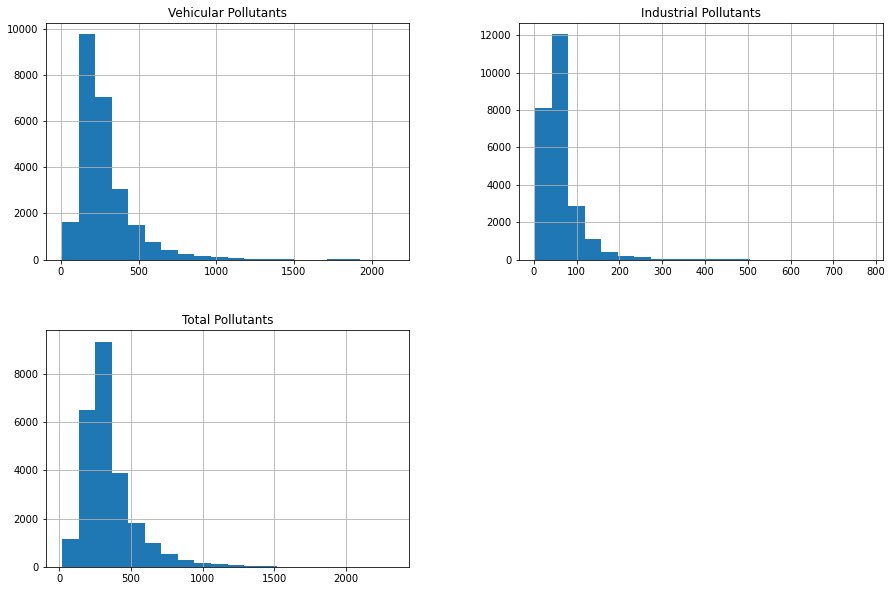

In [109]:
city_day_bcovid_req.hist(stacked=True, bins=20, figsize=(15,10))

array([[<AxesSubplot:title={'center':'Vehicular Pollutants'}>,
        <AxesSubplot:title={'center':'Industrial Pollutants'}>],
       [<AxesSubplot:title={'center':'Total Pollutants'}>,
        <AxesSubplot:>]], dtype=object)

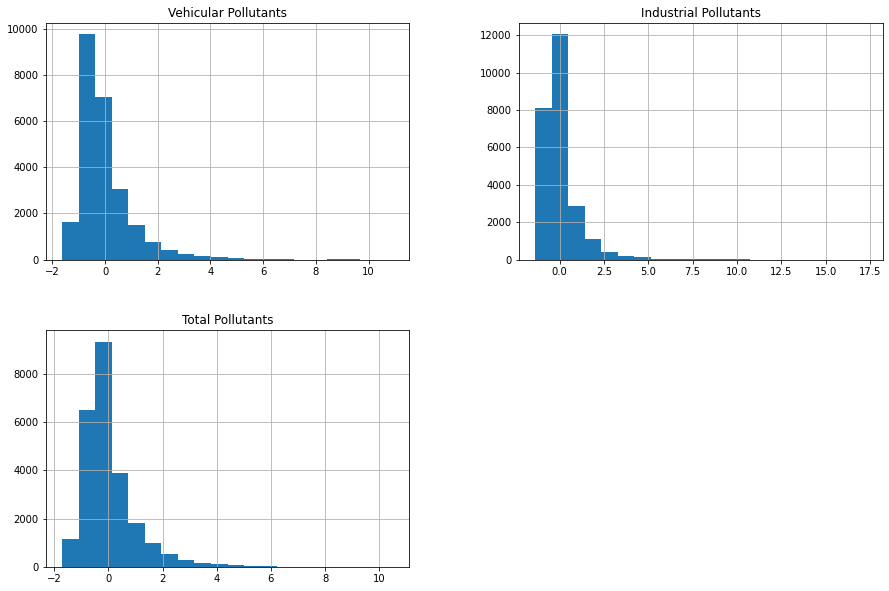

In [110]:
city_day_bcovid_norm.hist(stacked=True, bins=20, figsize=(15,10))

In [111]:
city_day_bcovid_req

,Vehicular Pollutants,Industrial Pollutants,Total Pollutants
0,197.205,163.05,360.255
1,194.085,71.56,265.645
2,243.795,85.22,329.015
3,199.845,70.24,270.085
4,263.375,107.32,370.695
...,...,...,...
29344,240.130,65.65,305.780
29345,180.610,93.24,273.850
29346,216.790,101.37,318.160
29347,222.470,94.36,316.830


In [112]:
total_pollutants_mean = city_day_bcovid_req.mean()['Total Pollutants']

**Hypothesis Test is performed on the Total Pollutants**
*In which we're saying that the alpha or p_value critical is taken as 0.05 as per the data.**

*We know that the if the pollutants is greater than 320 ug / m3, then it will be considered as Bad quality air.*

**So by considering the above statement we're taking the hypothesis:**

**Null Hypothesis(H0) >= 320**
**Alternate Hypothesis(H1) < 320**

In [113]:
total_pollutants_std = city_day_bcovid_req.std()['Total Pollutants']

**Calculating the Z Score value:**

In [114]:
total_pollutants_zscore = (total_pollutants_mean - 320)/total_pollutants_std

In [115]:
total_pollutants_zscore

0.12925977347574807

**Calculating the p-value:**

In [116]:

total_pollutants_pvalue = st.norm.sf(abs(total_pollutants_zscore))

In [117]:
total_pollutants_pvalue

0.4485760502293482

**Here we're getting that p-value is greater than 0.05 which means that our Null Hypothesis is right.**

**This shows that the air pollution is poor before covid, which is logical also.**

### After Covid

In [118]:
city_day_afcovid = city_day_update2.copy()

In [119]:
city_day_afcovid = city_day_afcovid[city_day_afcovid['Date'] > ('01-01-2020')]

**Making two types of pollutant Groups**<br/>
*Vehicular Pollutant = PM2.5 + PM10 + NO + NO2 + NOx + NH3 + CO*<br/>
*Industrial Pollutant = SO2 + O3 + Benzene + Toluene + Xylene*

In [120]:
city_day_afcovid['Vehicular Pollutants'] = city_day_afcovid['PM2.5']+city_day_afcovid['PM10']+city_day_afcovid['NO']+city_day_afcovid['NO2']+city_day_afcovid['NOx']+city_day_afcovid['NH3']+city_day_afcovid['CO']

In [121]:
city_day_afcovid['Industrial Pollutants'] = city_day_afcovid['SO2']+city_day_afcovid['O3']+city_day_afcovid['Benzene']+city_day_afcovid['Toluene']+city_day_afcovid['Xylene']

In [122]:
city_day_afcovid['Total Pollutants'] = city_day_afcovid['PM2.5']+city_day_afcovid['PM10']+city_day_afcovid['NO']+city_day_afcovid['NO2']+city_day_afcovid['NOx']+city_day_afcovid['NH3']+city_day_afcovid['CO']+city_day_afcovid['SO2']+city_day_afcovid['O3']+city_day_afcovid['Benzene']+city_day_afcovid['Toluene']+city_day_afcovid['Xylene']

In [123]:
city_day_afcovid = city_day_afcovid.drop(['PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2',
       'O3','Benzene','Toluene','Xylene'],axis=1)

In [124]:
city_day_afcovid.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4623 entries, 1827 to 29530
Data columns (total 7 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   City                   4623 non-null   object        
 1   Date                   4623 non-null   datetime64[ns]
 2   AQI                    4623 non-null   float64       
 3   Air_quality            4623 non-null   object        
 4   Vehicular Pollutants   4623 non-null   float64       
 5   Industrial Pollutants  4623 non-null   float64       
 6   Total Pollutants       4623 non-null   float64       
dtypes: datetime64[ns](1), float64(4), object(2)
memory usage: 288.9+ KB


#### Plotting some visual data for further interpretation**

In [125]:
#Function for plotting.
def ploting(var):
    city_day_afcovid[var].iplot(title=var,xTitle='Cities',yTitle=var, linecolor='black', )
    plt.show()
ploting('Vehicular Pollutants')
ploting('Industrial Pollutants')
ploting('Total Pollutants')

#### Plotting the Most Polluted cities in the Bar form on the basis of types of pollutants and total pollutants

In [126]:
def max_bar_plot(var):
    x1 = city_day_afcovid[['City',var]].groupby(["City"]).median().sort_values(by = var,
    ascending = True).tail(10).iplot(kind='bar', xTitle='Cities',yTitle=var, 
                                     linecolor='black', title='{2} {1} {0}'.format(")",var,' Most polluted cities('))

p1 = max_bar_plot('Industrial Pollutants')
p2 = max_bar_plot('Vehicular Pollutants')
p3 = max_bar_plot('Total Pollutants')

#### Plotting the Least Polluted cities in the Bar form on the basis of types of pollutants and total pollutants

In [127]:
def min_bar_plot(var):
    x1 = city_day_afcovid[['City',var]].groupby(["City"]).mean().sort_values(by = var,
    ascending = True).head(10).iplot(kind='bar', yTitle='Cities',xTitle=var, linecolor='black',title='{2} {1} {0}'.format(")",var,' Least polluted cities ('))
p1 = min_bar_plot('Industrial Pollutants')
p2 = min_bar_plot('Vehicular Pollutants')
p3 = min_bar_plot('Total Pollutants')

#### Satisfaction Level of people in the cities that are majorly polluted

In [128]:
def al(var):
    cities = [var]
    city_day_afcovid1 = city_day_afcovid[city_day_afcovid['Date'] > '01-01-2020']
    AQI = city_day_afcovid1[city_day_afcovid1.City.isin(cities)][['City','Air_quality']]
    AQI[var] = AQI['Air_quality']
    k = AQI[var].value_counts()
    m = pd.DataFrame((round((k/sum(k))*100)))
    return m
c1 = al('Delhi')
c2 = al('Ahmedabad')
c3 = al('Bhopal')
c4 = al('Jaipur')
c5 = al('Patna')
c6 = al('Lucknow')
c7 = al('Kolkata')
df_row = pd.concat([c1,c2,c3,c4,c5],axis=1)
df_row.iplot(kind='bar', align='center',xTitle='Satisfaction level', yTitle='Percentage of Satisfaction' ,linecolor='black', title='Satisfaction level of people (After COVID-19)')

In [129]:
city_day_clean = city_day_update2.to_csv("city_day_update.csv", index = False)

In [130]:
city_day_afcovid

,City,Date,AQI,Air_quality,Vehicular Pollutants,Industrial Pollutants,Total Pollutants
1827,Ahmedabad,2020-01-02,162.0,Moderate,248.62,85.00,333.62
1828,Ahmedabad,2020-01-03,220.0,Poor,256.23,97.88,354.11
1829,Ahmedabad,2020-01-04,254.0,Poor,276.04,100.41,376.45
1830,Ahmedabad,2020-01-05,255.0,Poor,219.89,106.40,326.29
1831,Ahmedabad,2020-01-06,175.0,Moderate,217.00,98.16,315.16
...,...,...,...,...,...,...,...
29526,Visakhapatnam,2020-06-27,41.0,Good,131.18,46.89,178.07
29527,Visakhapatnam,2020-06-28,70.0,Satisfactory,156.99,46.19,203.18
29528,Visakhapatnam,2020-06-29,68.0,Satisfactory,151.14,40.36,191.50
29529,Visakhapatnam,2020-06-30,54.0,Satisfactory,129.27,43.13,172.40


**Before doing the hypothesis testing we are doing the normalisation and standardisation of dataset**

In [131]:
#city_day_afcovid:mean
vehicular_pollutants_meanaf = city_day_afcovid['Vehicular Pollutants'].mean()
industrial_pollutants_meanaf = city_day_afcovid['Industrial Pollutants'].mean()
total_pollutants_meanaf = city_day_afcovid['Total Pollutants'].mean()

#city_day_afcovid:standard deviation
vehicular_pollutants_varaf = city_day_afcovid['Vehicular Pollutants'].std() **2
industrial_pollutants_varaf = city_day_afcovid['Industrial Pollutants'].std() **2
total_pollutants_varaf = city_day_afcovid['Total Pollutants'].std() **2

pollutant_mean_varaf = {'Pollutants' : ['Vehicular Pollutants', 'Industrial Pollutants', 'Total Pollutants'],
                      'Mean' : [vehicular_pollutants_meanaf,industrial_pollutants_meanaf,total_pollutants_meanaf],
                      'Variance' : [vehicular_pollutants_varaf,industrial_pollutants_varaf,total_pollutants_varaf]}

afcovid_mean_var = pd.DataFrame(pollutant_mean_varaf,columns = ['Pollutants','Mean','Variance'])

print(afcovid_mean_var)

              Pollutants        Mean      Variance
0   Vehicular Pollutants  219.726823  18957.688067
1  Industrial Pollutants   61.207863   4191.823405
2       Total Pollutants  280.934686  23610.013374


#### We're using the Standard Scaling method in which Mean is set to 0 and Variance to 1.

In [132]:
city_day_afcovid_req = city_day_afcovid[['Vehicular Pollutants','Industrial Pollutants', 'Total Pollutants']]

In [133]:
city_day_afcovid_req

,Vehicular Pollutants,Industrial Pollutants,Total Pollutants
1827,248.62,85.00,333.62
1828,256.23,97.88,354.11
1829,276.04,100.41,376.45
1830,219.89,106.40,326.29
1831,217.00,98.16,315.16
...,...,...,...
29526,131.18,46.89,178.07
29527,156.99,46.19,203.18
29528,151.14,40.36,191.50
29529,129.27,43.13,172.40


In [134]:
scaleraf = StandardScaler()
x_scaledaf = scaleraf.fit_transform(city_day_afcovid_req)
city_day_afcovid_norm = pd.DataFrame(x_scaledaf)
city_day_afcovid_norm.rename(columns = {0 : 'Vehicular Pollutants', 1 : 'Industrial Pollutants', 2 : 'Total Pollutants'}, inplace = True)

city_day_afcovid_norm.head()

,Vehicular Pollutants,Industrial Pollutants,Total Pollutants
0,0.209870,0.367518,0.342917
1,0.265146,0.566476,0.476281
2,0.409039,0.605557,0.621687
3,0.001185,0.698085,0.295207
4,-0.019807,0.570801,0.222765


In [135]:
city_day_afcovid_norm.mean()
#Here mean is apporximated to 0.

Vehicular Pollutants     1.229579e-17
Industrial Pollutants   -4.303525e-17
Total Pollutants         6.762682e-17
dtype: float64

In [136]:
city_day_afcovid_norm.std()
#Here standard deviation is approximated to 1.

Vehicular Pollutants     1.000108
Industrial Pollutants    1.000108
Total Pollutants         1.000108
dtype: float64

In [137]:
city_day_afcovid_req.skew()

Vehicular Pollutants      1.872608
Industrial Pollutants    10.533733
Total Pollutants          1.835976
dtype: float64

In [138]:
city_day_afcovid_norm.skew()

Vehicular Pollutants      1.872608
Industrial Pollutants    10.533733
Total Pollutants          1.835976
dtype: float64

In [139]:
city_day_afcovid_req.describe()

,Vehicular Pollutants,Industrial Pollutants,Total Pollutants
count,4623.000000,4623.000000,4623.000000
mean,219.726823,61.207863,280.934686
std,137.686920,64.744292,153.655502
min,15.790000,3.980000,38.910000
25%,126.520000,37.800000,174.445000
50%,189.730000,50.840000,251.860000
75%,270.150000,71.225000,342.095000
max,1266.900000,969.380000,1298.770000


array([[<AxesSubplot:title={'center':'Vehicular Pollutants'}>,
        <AxesSubplot:title={'center':'Industrial Pollutants'}>],
       [<AxesSubplot:title={'center':'Total Pollutants'}>,
        <AxesSubplot:>]], dtype=object)

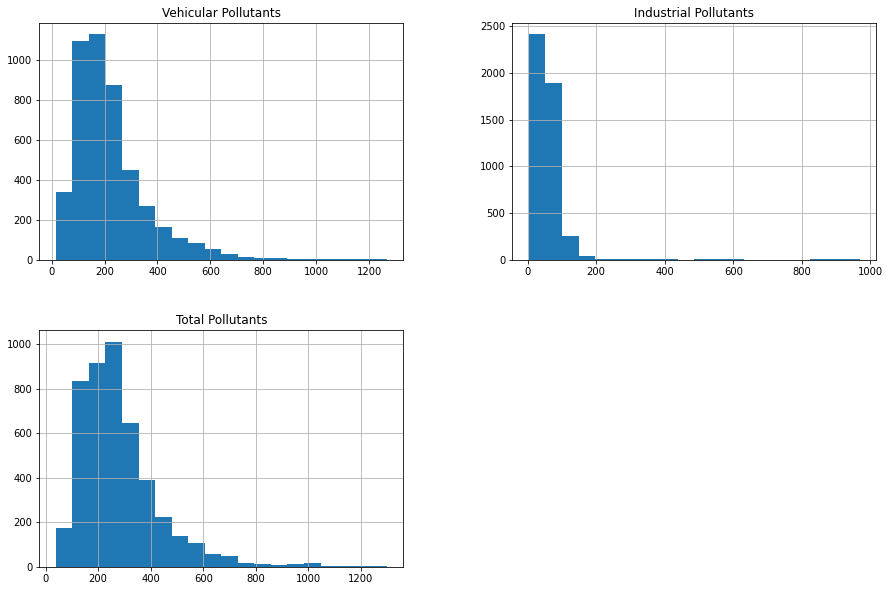

In [140]:
city_day_afcovid_req.hist(stacked=True, bins=20, figsize=(15,10))

array([[<AxesSubplot:title={'center':'Vehicular Pollutants'}>,
        <AxesSubplot:title={'center':'Industrial Pollutants'}>],
       [<AxesSubplot:title={'center':'Total Pollutants'}>,
        <AxesSubplot:>]], dtype=object)

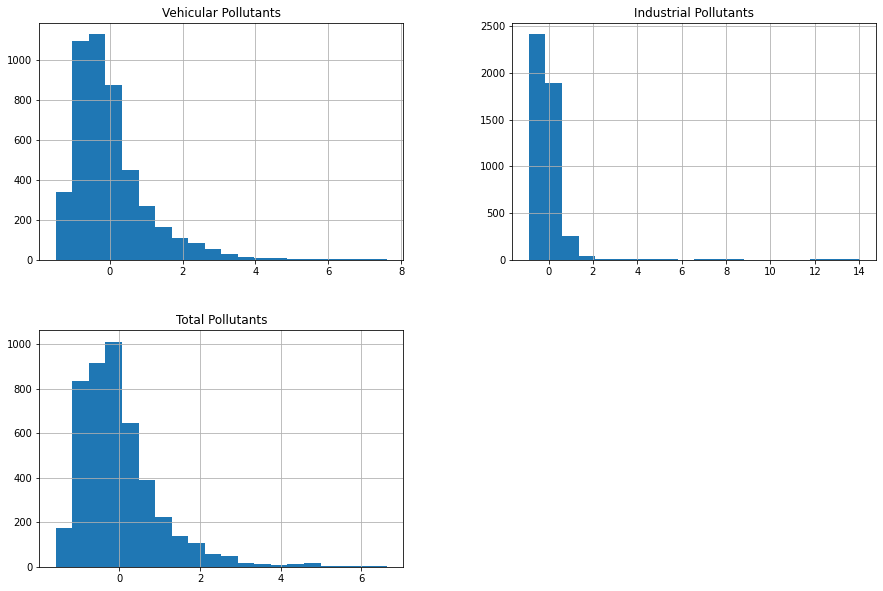

In [141]:
city_day_afcovid_norm.hist(stacked=True, bins=20, figsize=(15,10))

In [142]:
city_day_afcovid_req

,Vehicular Pollutants,Industrial Pollutants,Total Pollutants
1827,248.62,85.00,333.62
1828,256.23,97.88,354.11
1829,276.04,100.41,376.45
1830,219.89,106.40,326.29
1831,217.00,98.16,315.16
...,...,...,...
29526,131.18,46.89,178.07
29527,156.99,46.19,203.18
29528,151.14,40.36,191.50
29529,129.27,43.13,172.40


In [143]:
total_pollutants_mean_af = city_day_afcovid_req.mean()['Total Pollutants']

**Hypothesis Test is performed on the Total Pollutants**
*In which we're saying that the alpha or p_value critical is taken as 0.05 as per the data.**

*We know that the if the pollutants is greater than 320 ug / m3, then it will be considered as Bad quality air.*

**So by considering the above statement we're taking the hypothesis:**

**Null Hypothesis(H0) >= 320**
**Alternate Hypothesis(H1) < 320**

In [144]:
total_pollutants_std_af = city_day_afcovid_req.std()['Total Pollutants']

**Calculating the Z-Score value:**

In [145]:
total_pollutants_zscore_af = (total_pollutants_mean_af - 320)/total_pollutants_std_af

In [146]:
total_pollutants_zscore_af

-0.25423960141421537

**Calculating the p-value:**

In [147]:
total_pollutants_pvalue_af = st.norm.sf(abs(total_pollutants_zscore_af))

In [148]:
total_pollutants_pvalue_af

0.39965522897962547

**Here we're getting that p-value is greater than 0.05 which means that our Null Hypothesis is right.**

**This shows that the air pollution is poor after covid also, which is again logical.**

## Predicting the AQI

**Here, we're going to predict the AQI in two ways:**<br>
**1) Calculating the AQI as whole of India yearly by using Linear Regression model**<br>
**2) Calculating the AQI for each city for upcoming years**


### 1. Calculating the AQI as whole of India yearly by using Linear Regression


In [149]:
city_day_update_temp= city_day_update2.copy()

In [150]:
city_day_update_temp

,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,Air_quality
0,Ahmedabad,2015-01-01,48.485,95.71,0.92,18.22,17.15,15.80,0.92,27.64,133.36,1.07,0.02,0.96,118.0,Moderate
1,Ahmedabad,2015-01-02,48.485,95.71,0.97,15.69,16.46,15.80,0.97,24.55,34.06,3.68,5.50,3.77,118.0,Moderate
2,Ahmedabad,2015-01-03,48.485,95.71,17.40,19.30,29.70,15.80,17.40,29.07,30.70,6.80,16.40,2.25,118.0,Moderate
3,Ahmedabad,2015-01-04,48.485,95.71,1.70,18.48,17.97,15.80,1.70,18.59,36.08,4.43,10.14,1.00,118.0,Moderate
4,Ahmedabad,2015-01-05,48.485,95.71,22.10,21.42,37.76,15.80,22.10,39.33,39.31,7.01,18.89,2.78,118.0,Moderate
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29526,Visakhapatnam,2020-06-27,15.020,50.94,7.68,25.06,19.54,12.47,0.47,8.55,23.30,2.24,12.07,0.73,41.0,Good
29527,Visakhapatnam,2020-06-28,24.380,74.09,3.42,26.06,16.53,11.99,0.52,12.72,30.14,0.74,2.21,0.38,70.0,Satisfactory
29528,Visakhapatnam,2020-06-29,22.910,65.73,3.45,29.53,18.33,10.71,0.48,8.42,30.96,0.01,0.01,0.96,68.0,Satisfactory
29529,Visakhapatnam,2020-06-30,16.640,49.97,4.05,29.26,18.80,10.03,0.52,9.84,28.30,1.07,2.96,0.96,54.0,Satisfactory


In [151]:
city_day_update_temp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29531 entries, 0 to 29530
Data columns (total 16 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   City         29531 non-null  object        
 1   Date         29531 non-null  datetime64[ns]
 2   PM2.5        29531 non-null  float64       
 3   PM10         29531 non-null  float64       
 4   NO           29531 non-null  float64       
 5   NO2          29531 non-null  float64       
 6   NOx          29531 non-null  float64       
 7   NH3          29531 non-null  float64       
 8   CO           29531 non-null  float64       
 9   SO2          29531 non-null  float64       
 10  O3           29531 non-null  float64       
 11  Benzene      29531 non-null  float64       
 12  Toluene      29531 non-null  float64       
 13  Xylene       29531 non-null  float64       
 14  AQI          29531 non-null  float64       
 15  Air_quality  29531 non-null  object        
dtypes: d

In [152]:
#Resampling the data for getting the date view of whole country.
city_day_update_pred = pd.DataFrame(city_day_update_temp.groupby('Date')["AQI"].mean()).reset_index()

In [153]:
city_day_update_pred.rename(columns = {'AQI' : 'AQI_avg'}, inplace = True)

In [154]:
#Splitting the data into month and year wise
city_day_update_pred['Month'] = city_day_update_pred['Date'].dt.month
city_day_update_pred['Year'] = city_day_update_pred['Date'].dt.year
city_day_update_pred = city_day_update_pred[['Date','Month','Year','AQI_avg']]
city_day_update_pred

,Date,Month,Year,AQI_avg
0,2015-01-01,1,2015,177.000000
1,2015-01-02,1,2015,174.000000
2,2015-01-03,1,2015,122.166667
3,2015-01-04,1,2015,146.714286
4,2015-01-05,1,2015,147.571429
...,...,...,...,...
2004,2020-06-27,6,2020,74.346154
2005,2020-06-28,6,2020,79.038462
2006,2020-06-29,6,2020,78.000000
2007,2020-06-30,6,2020,72.230769


#### Predicting the AQI for taking all years in consideration

In [155]:
#Predicting the AQI for taking all years in consideration.
city_day_pred_whole = city_day_update_pred.copy()

In [156]:
city_day_pred_whole

,Date,Month,Year,AQI_avg
0,2015-01-01,1,2015,177.000000
1,2015-01-02,1,2015,174.000000
2,2015-01-03,1,2015,122.166667
3,2015-01-04,1,2015,146.714286
4,2015-01-05,1,2015,147.571429
...,...,...,...,...
2004,2020-06-27,6,2020,74.346154
2005,2020-06-28,6,2020,79.038462
2006,2020-06-29,6,2020,78.000000
2007,2020-06-30,6,2020,72.230769


<AxesSubplot:xlabel='AQI_avg'>

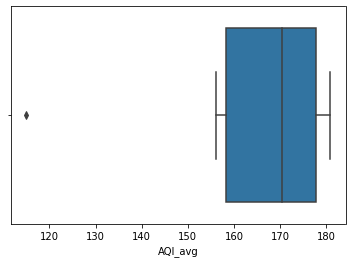

In [157]:
#Applying boxplot analysis
city_day_pred_whole = city_day_pred_whole[['AQI_avg','Year']].groupby(["Year"]).mean().reset_index().sort_values(by='Year',ascending=False)
city_day_pred_whole=city_day_pred_whole.dropna()
city_day_pred_whole.describe()

sns.boxplot(x=city_day_pred_whole['AQI_avg'])

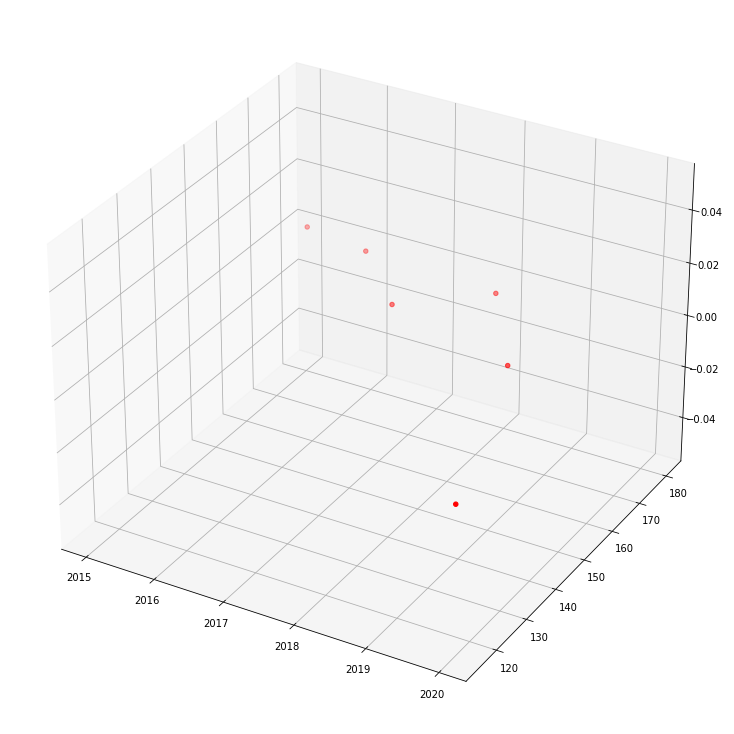

In [158]:
#Visualizing the filtered data

Year=city_day_pred_whole['Year'].values
AQI=city_day_pred_whole['AQI_avg'].values
city_day_pred_whole['AQI_avg']=pd.to_numeric(city_day_pred_whole['AQI_avg'],errors='coerce')
city_day_pred_whole['Year']=pd.to_numeric(city_day_pred_whole['Year'],errors='coerce')

#Plotting by using 3d graph
plt.rcParams['figure.figsize'] = (20.0, 10.0)
fig = plt.figure()
ax = fig.add_subplot(111, projection="3d")
ax.set_position([0, 0, 0.95, 1])
ax.scatter(Year,AQI, color='red')
plt.show()

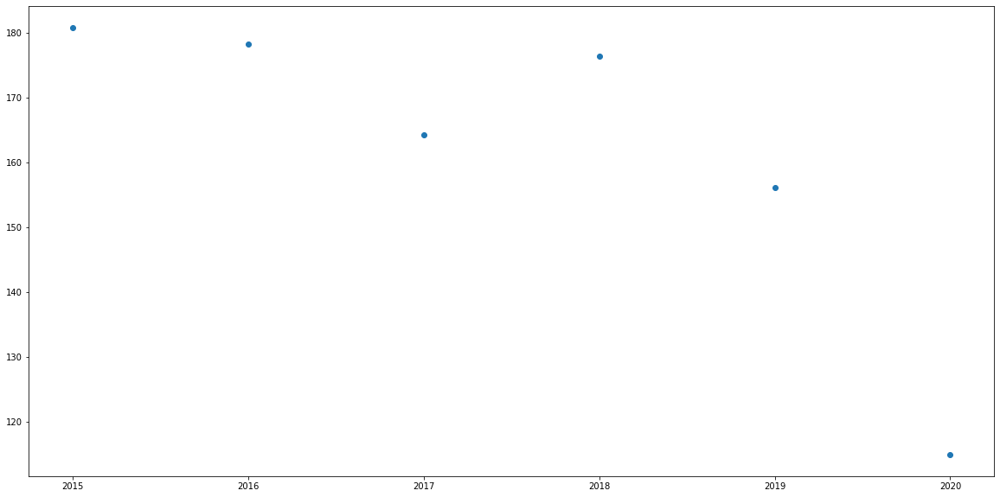

In [159]:
#scatter plot of data points
cols =['Year']
y_whole = city_day_pred_whole['AQI_avg']
x_whole = city_day_pred_whole[cols]

plt.scatter(x_whole,y_whole)
plt.show()

In [160]:
x_whole = (x_whole - x_whole.mean()) / x_whole.std()
x_whole = np.c_[np.ones(x_whole.shape[0]), x_whole]
x_whole

array([[ 1.        ,  1.33630621],
       [ 1.        ,  0.80178373],
       [ 1.        ,  0.26726124],
       [ 1.        , -0.26726124],
       [ 1.        , -0.80178373],
       [ 1.        , -1.33630621]])

In [161]:
# Applying GRADIENT DESCENT 

alpha = 0.1 #Step size
iterations = 3000 #No. of iterations
m = y_whole.size #No. of data points
np.random.seed(4) #Setting the seed
theta = np.random.rand(2) #Picking random values to start with

def gradient_descent(x_whole, y_whole, theta, iterations, alpha):
    past_costs = []
    past_thetas = [theta]
    for i in range(iterations):
        prediction = np.dot(x_whole, theta)
        error = prediction - y_whole
        cost = 1/(2*m) * np.dot(error.T, error)
        past_costs.append(cost)
        theta = theta - (alpha * (1/m) * np.dot(x_whole.T, error))
        past_thetas.append(theta)
        
    return past_thetas, past_costs
past_thetas, past_costs = gradient_descent(x_whole, y_whole, theta, iterations, alpha)
theta = past_thetas[-1]

#Printing the results...
print("Gradient Descent: {:.2f}, {:.2f}".format(theta[0], theta[1]))

Gradient Descent: 161.82, -20.54


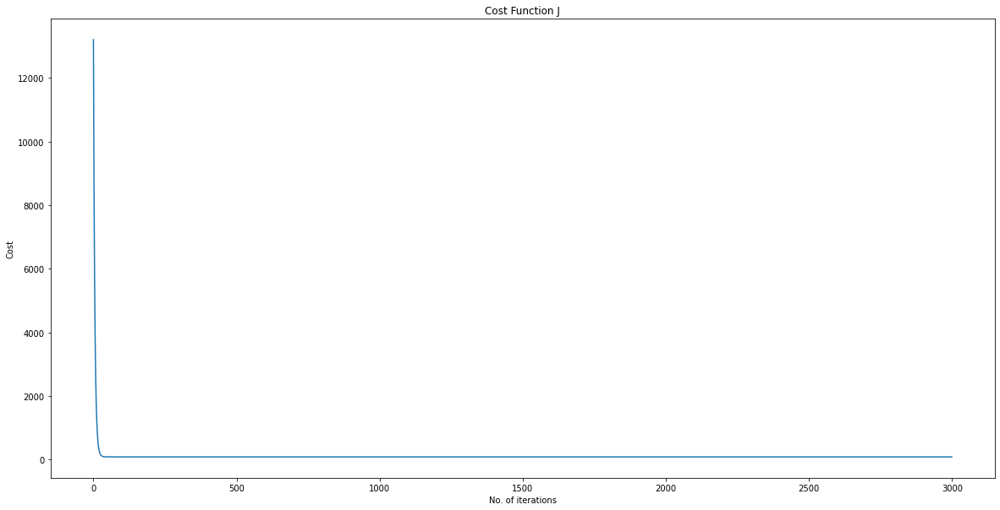

In [162]:
#Plotting the cost function...
plt.title('Cost Function J')
plt.xlabel('No. of iterations')
plt.ylabel('Cost')
plt.plot(past_costs)
plt.show()

In [163]:
#Predicted value
newB=[ 161.82, -20.54]
def rmse(y_whole,y_pred_whole):
    rmse=np.sqrt(sum(y_whole-y_pred_whole))
    return rmse

   
y_pred_whole=x_whole.dot(newB)

dt = pd.DataFrame({'Actual': y_whole, 'Predicted': y_pred_whole})  
x_whole = pd.concat([city_day_pred_whole, dt], axis=1)
x_whole
x_whole

,Year,AQI_avg,Actual,Predicted
5,2020,114.927696,114.927696,134.372270
4,2019,156.116369,156.116369,145.351362
3,2018,176.373409,176.373409,156.330454
2,2017,164.348404,164.348404,167.309546
1,2016,178.330358,178.330358,178.288638
0,2015,180.848065,180.848065,189.267730


In [164]:
#calculating the root mean squared error for the predicted AQI values
print(np.sqrt(metrics.mean_squared_error(y_whole,y_pred_whole)))

12.749887150652524


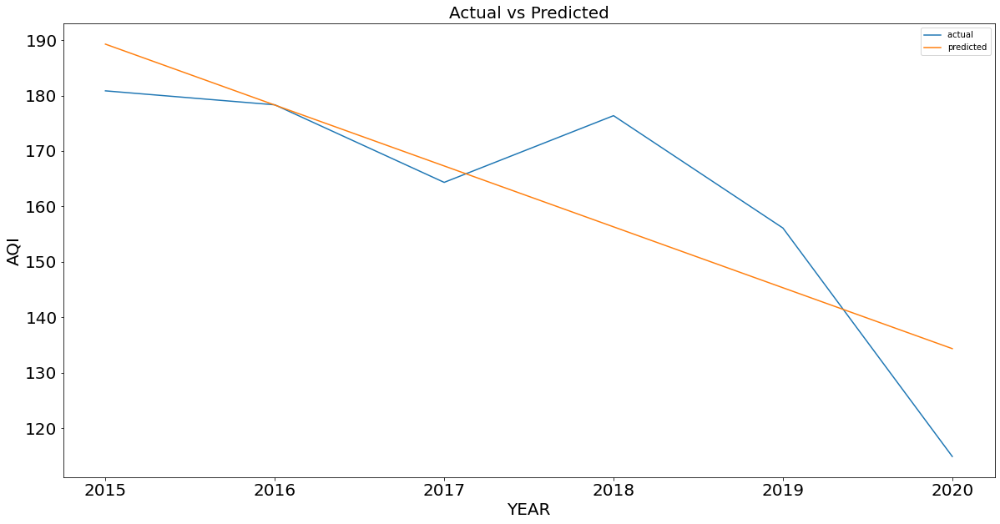

In [165]:
x_axis=x_whole.Year
y_axis=x_whole.Actual
y1_axis=x_whole.Predicted
plt.plot(x_axis,y_axis)
plt.plot(x_axis,y1_axis)
plt.title("Actual vs Predicted",fontsize=20)
plt.legend(["actual ","predicted"])
plt.xlabel("YEAR",fontsize=20)
plt.ylabel("AQI",fontsize=20)
plt.tick_params(labelsize=20)
plt.show()

#### Predicting the AQI by taking the years before COVID-19

In [166]:
city_day_pred_bfcovid = city_day_update_pred.copy()

In [167]:
city_day_pred_bfcovid = city_day_pred_bfcovid[city_day_pred_bfcovid['Date'] <= ('01-01-2020')]

In [168]:
city_day_pred_bfcovid

,Date,Month,Year,AQI_avg
0,2015-01-01,1,2015,177.000000
1,2015-01-02,1,2015,174.000000
2,2015-01-03,1,2015,122.166667
3,2015-01-04,1,2015,146.714286
4,2015-01-05,1,2015,147.571429
...,...,...,...,...
1822,2019-12-28,12,2019,183.434783
1823,2019-12-29,12,2019,204.304348
1824,2019-12-30,12,2019,221.565217
1825,2019-12-31,12,2019,204.956522


<AxesSubplot:xlabel='AQI_avg'>

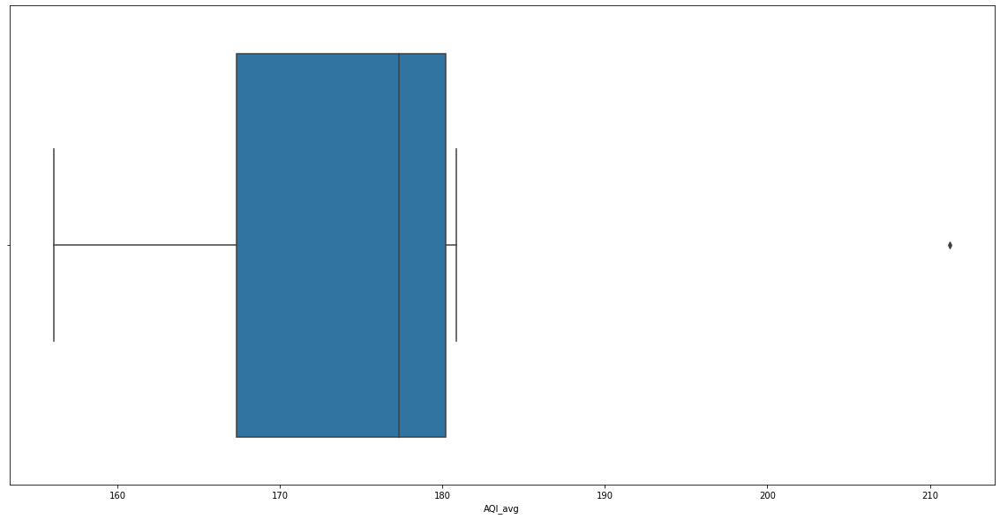

In [169]:
#Applying boxplot analysis
city_day_pred_bfcovid = city_day_pred_bfcovid[['AQI_avg','Year']].groupby(["Year"]).mean().reset_index().sort_values(by='Year',ascending=False)
city_day_pred_bfcovid = city_day_pred_bfcovid.dropna()
city_day_pred_bfcovid.describe()

sns.boxplot(x=city_day_pred_bfcovid['AQI_avg'])

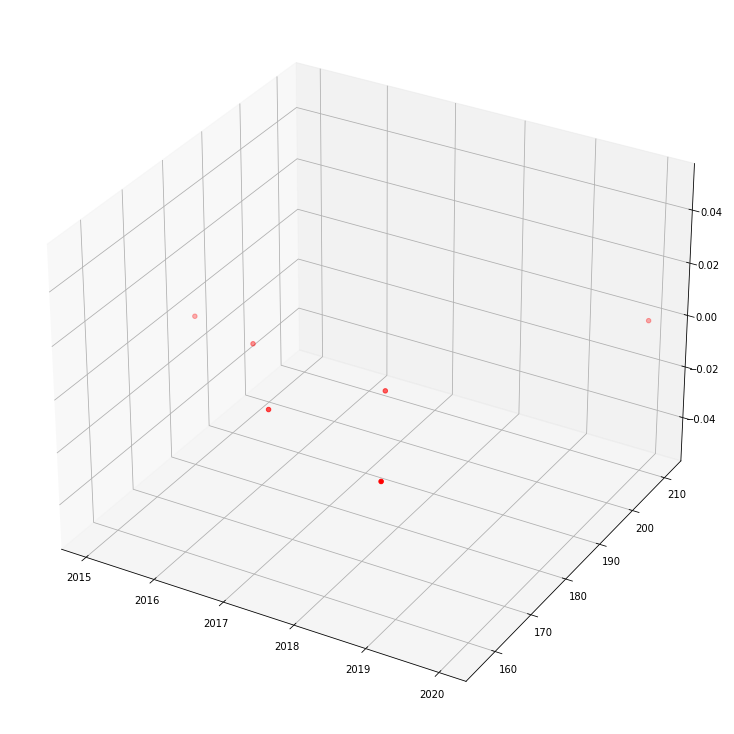

In [170]:
#Visualizing the filtered data

Year=city_day_pred_bfcovid['Year'].values
AQI=city_day_pred_bfcovid['AQI_avg'].values
city_day_pred_bfcovid['AQI_avg']=pd.to_numeric(city_day_pred_bfcovid['AQI_avg'],errors='coerce')
city_day_pred_bfcovid['Year']=pd.to_numeric(city_day_pred_bfcovid['Year'],errors='coerce')

#Plotting by using 3d graph
plt.rcParams['figure.figsize'] = (20.0, 10.0)
fig = plt.figure()
ax = fig.add_subplot(111, projection="3d")
ax.set_position([0, 0, 0.95, 1])
ax.scatter(Year,AQI, color='red')
plt.show()

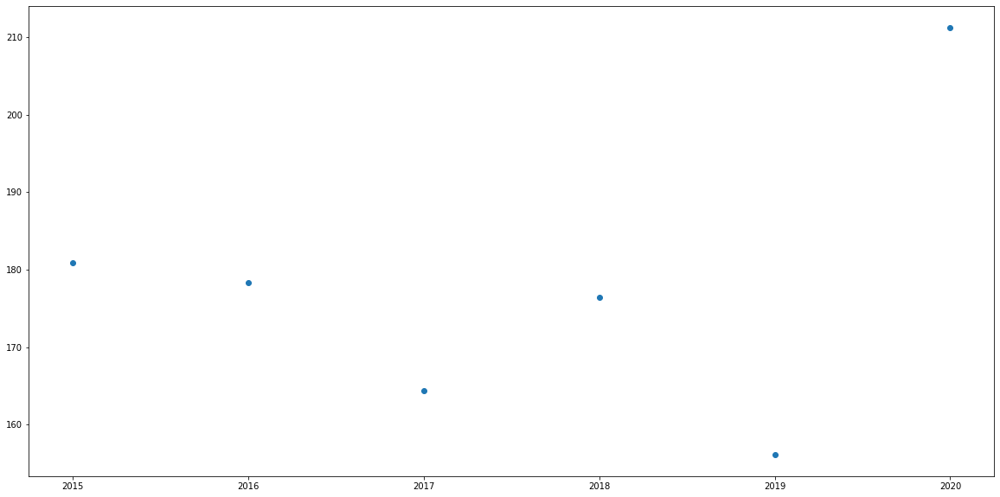

In [171]:
#scatter plot of data points
cols =['Year']
y_bf = city_day_pred_bfcovid['AQI_avg']
x_bf = city_day_pred_bfcovid[cols]

plt.scatter(x_bf,y_bf)
plt.show()

In [172]:
x_bf = (x_bf - x_bf.mean()) / x_bf.std()
x_bf = np.c_[np.ones(x_bf.shape[0]), x_bf]
x_bf

array([[ 1.        ,  1.33630621],
       [ 1.        ,  0.80178373],
       [ 1.        ,  0.26726124],
       [ 1.        , -0.26726124],
       [ 1.        , -0.80178373],
       [ 1.        , -1.33630621]])

In [173]:
# Applying GRADIENT DESCENT 

alpha = 0.1 #Step size
iterations = 3000 #No. of iterations
m = y_bf.size #No. of data points
np.random.seed(4) #Setting the seed
theta = np.random.rand(2) #Picking random values to start with

def gradient_descent(x_bf, y_bf, theta, iterations, alpha):
    past_costs = []
    past_thetas = [theta]
    for i in range(iterations):
        prediction = np.dot(x_bf, theta)
        error = prediction - y_bf
        cost = 1/(2*m) * np.dot(error.T, error)
        past_costs.append(cost)
        theta = theta - (alpha * (1/m) * np.dot(x_bf.T, error))
        past_thetas.append(theta)
        
    return past_thetas, past_costs
past_thetas_bf, past_costs_bf = gradient_descent(x_bf, y_bf, theta, iterations, alpha)
theta_bf = past_thetas_bf[-1]

#Printing the results...
print("Gradient Descent: {:.2f}, {:.2f}".format(theta_bf[0], theta_bf[1]))

Gradient Descent: 177.87, 5.20


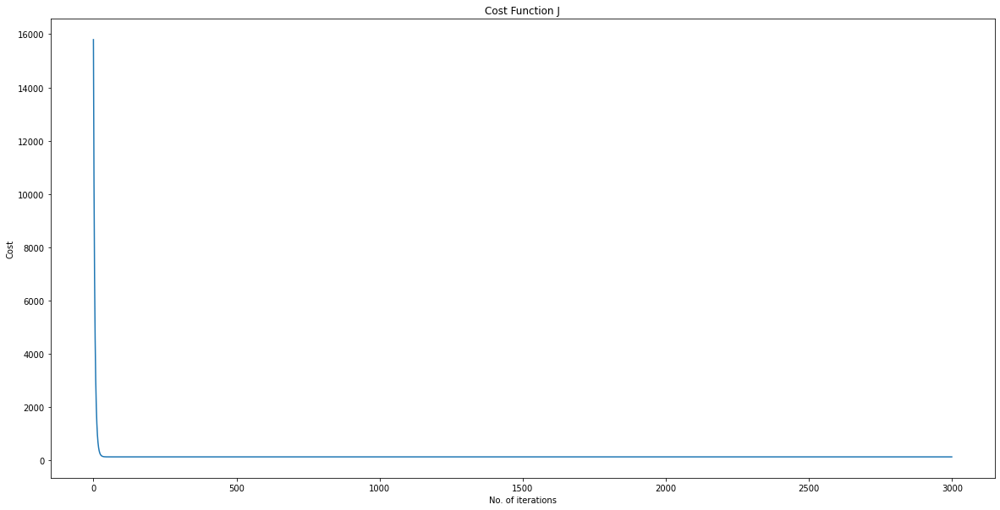

In [174]:
#Plotting the cost function...
plt.title('Cost Function J')
plt.xlabel('No. of iterations')
plt.ylabel('Cost')
plt.plot(past_costs_bf)
plt.show()

In [175]:
#Predicted value
newB=[ 177.87, 5.20]
def rmse(y_bf,y_pred_bf):
    rmse=np.sqrt(sum(y_bf-y_pred_bf))
    return rmse

   
y_pred_bf=x_bf.dot(newB)

dt = pd.DataFrame({'Actual': y_bf, 'Predicted': y_pred_bf})  
x_bf = pd.concat([city_day_pred_whole, dt], axis=1)
x_bf
x_bf

,Year,AQI_avg,Actual,Predicted
5,2020,114.927696,211.217391,184.818792
4,2019,156.116369,156.116369,182.039275
3,2018,176.373409,176.373409,179.259758
2,2017,164.348404,164.348404,176.480242
1,2016,178.330358,178.330358,173.700725
0,2015,180.848065,180.848065,170.921208


In [176]:
#calculating the root mean squared error for the predicted AQI values
print(np.sqrt(metrics.mean_squared_error(y_bf,y_pred_bf)))

16.55481596210976


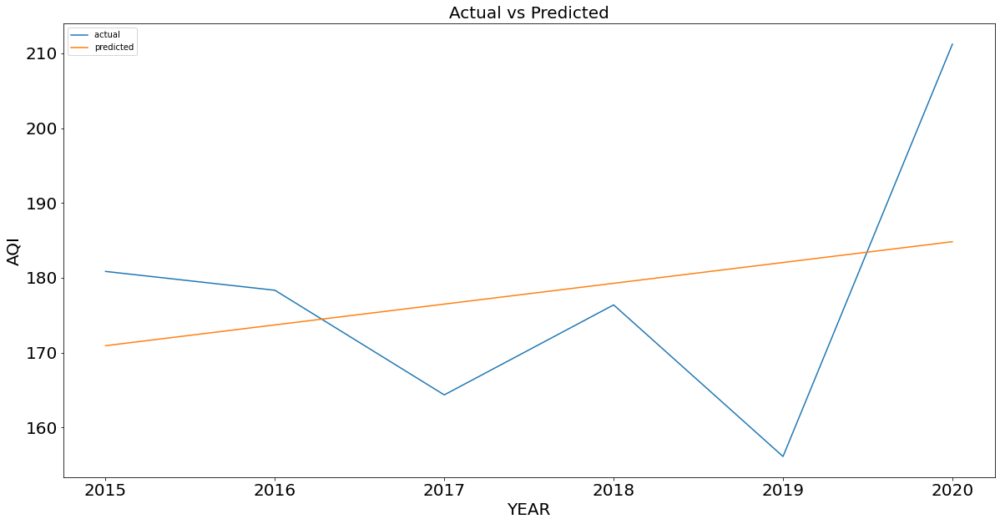

In [177]:
x_axis=x_bf.Year
y_axis=x_bf.Actual
y1_axis=x_bf.Predicted
plt.plot(x_axis,y_axis)
plt.plot(x_axis,y1_axis)
plt.title("Actual vs Predicted",fontsize=20)
plt.legend(["actual ","predicted"])
plt.xlabel("YEAR",fontsize=20)
plt.ylabel("AQI",fontsize=20)
plt.tick_params(labelsize=20)
plt.show()

#### Predicting the AQI by taking the years after COVID-19

In [178]:
city_day_pred_afcovid = city_day_update_pred.copy()

In [179]:
city_day_pred_afcovid = city_day_pred_afcovid[city_day_pred_afcovid['Date'] >= ('01-01-2020')]

In [180]:
city_day_pred_afcovid

,Date,Month,Year,AQI_avg
1826,2020-01-01,1,2020,211.217391
1827,2020-01-02,1,2020,187.260870
1828,2020-01-03,1,2020,163.739130
1829,2020-01-04,1,2020,146.956522
1830,2020-01-05,1,2020,160.521739
...,...,...,...,...
2004,2020-06-27,6,2020,74.346154
2005,2020-06-28,6,2020,79.038462
2006,2020-06-29,6,2020,78.000000
2007,2020-06-30,6,2020,72.230769


In [181]:
city_day_pred_afcovid.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 183 entries, 1826 to 2008
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   Date     183 non-null    datetime64[ns]
 1   Month    183 non-null    int64         
 2   Year     183 non-null    int64         
 3   AQI_avg  183 non-null    float64       
dtypes: datetime64[ns](1), float64(1), int64(2)
memory usage: 7.1 KB


<AxesSubplot:xlabel='AQI_avg'>

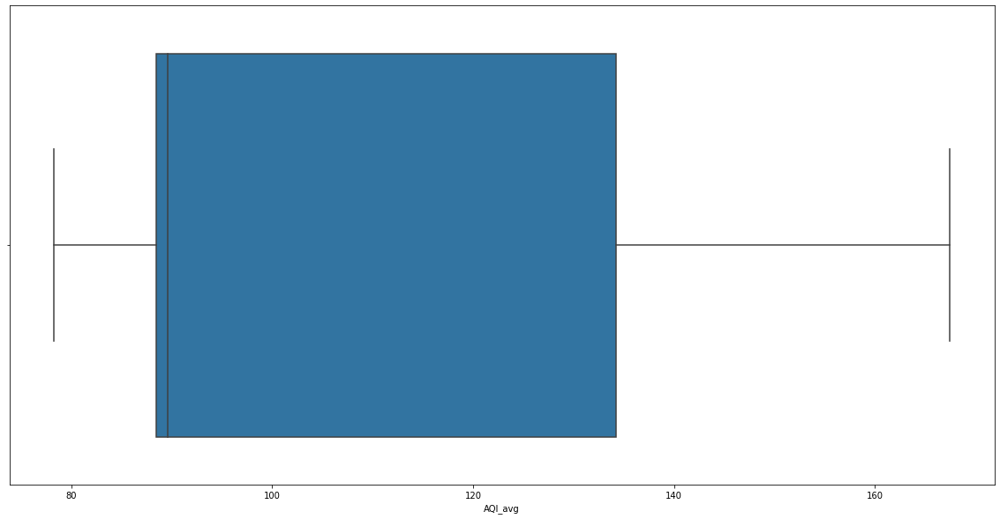

In [182]:
#Applying boxplot analysis
city_day_pred_afcovid = city_day_pred_afcovid[['AQI_avg','Month']].groupby(["Month"]).mean().reset_index().sort_values(by='Month',ascending=False)
city_day_pred_afcovid = city_day_pred_afcovid.dropna()
city_day_pred_afcovid.describe()

sns.boxplot(x=city_day_pred_afcovid['AQI_avg'])

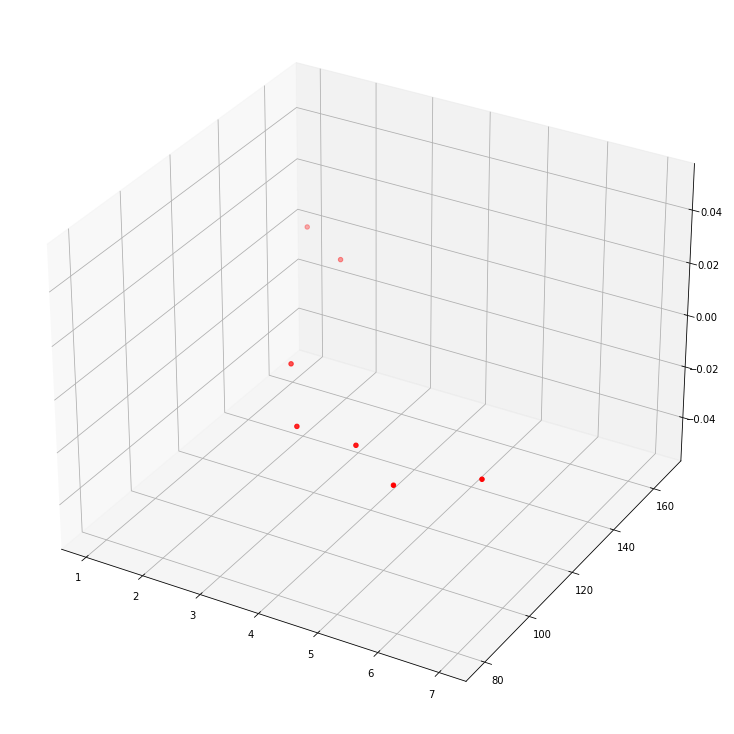

In [183]:
#Visualizing the filtered data

Month=city_day_pred_afcovid['Month'].values
AQI=city_day_pred_afcovid['AQI_avg'].values
city_day_pred_afcovid['AQI_avg']=pd.to_numeric(city_day_pred_afcovid['AQI_avg'],errors='coerce')
city_day_pred_afcovid['Month']=pd.to_numeric(city_day_pred_afcovid['Month'],errors='coerce')

#Plotting by using 3d graph
plt.rcParams['figure.figsize'] = (20.0, 10.0)
fig = plt.figure()
ax = fig.add_subplot(111, projection="3d")
ax.set_position([0, 0, 0.95, 1])
ax.scatter(Month,AQI, color='red')
plt.show()

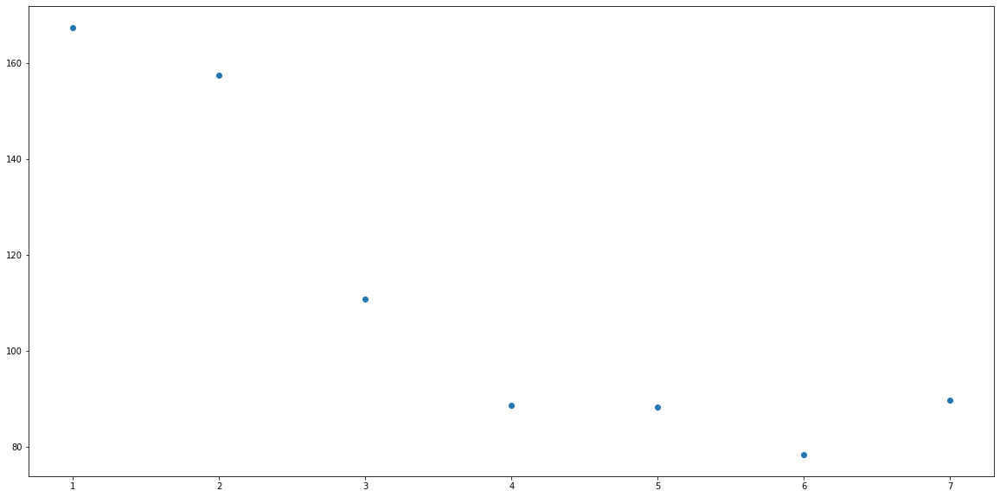

In [184]:
#scatter plot of data points
cols =['Month']
y_af = city_day_pred_afcovid['AQI_avg']
x_af = city_day_pred_afcovid[cols]

plt.scatter(x_af,y_af)
plt.show()

In [185]:
x_af = (x_af - x_af.mean()) / x_af.std()
x_af = np.c_[np.ones(x_af.shape[0]), x_af]
x_af

array([[ 1.        ,  1.38873015],
       [ 1.        ,  0.9258201 ],
       [ 1.        ,  0.46291005],
       [ 1.        ,  0.        ],
       [ 1.        , -0.46291005],
       [ 1.        , -0.9258201 ],
       [ 1.        , -1.38873015]])

In [186]:
# Applying GRADIENT DESCENT 

alpha = 0.1 #Step size
iterations = 3000 #No. of iterations
m = y_af.size #No. of data points
np.random.seed(4) #Setting the seed
theta = np.random.rand(2) #Picking random values to start with

def gradient_descent(x_af, y_af, theta, iterations, alpha):
    past_costs = []
    past_thetas = [theta]
    for i in range(iterations):
        prediction = np.dot(x_af, theta)
        error = prediction - y_af
        cost = 1/(2*m) * np.dot(error.T, error)
        past_costs.append(cost)
        theta = theta - (alpha * (1/m) * np.dot(x_af.T, error))
        past_thetas.append(theta)
        
    return past_thetas, past_costs
past_thetas_af, past_costs_af = gradient_descent(x_af, y_af, theta, iterations, alpha)
theta_af = past_thetas_af[-1]

#Printing the results...
print("Gradient Descent: {:.2f}, {:.2f}".format(theta_af[0], theta_af[1]))

Gradient Descent: 111.53, -31.99


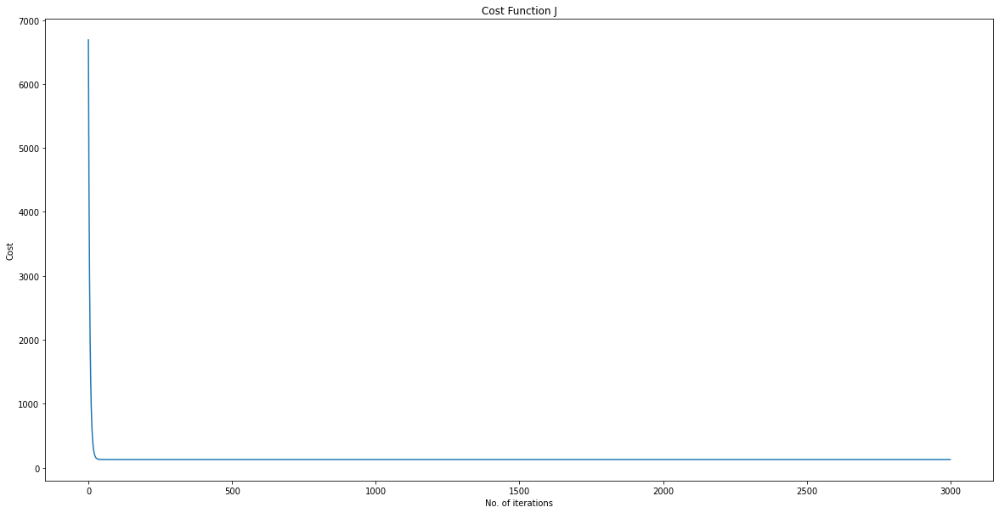

In [187]:
#Plotting the cost function...
plt.title('Cost Function J')
plt.xlabel('No. of iterations')
plt.ylabel('Cost')
plt.plot(past_costs_af)
plt.show()

In [188]:
#Predicted val
newB=[ 111.53, -31.99]
def rmse(y_af,y_pred_af):
    rmse=np.sqrt(sum(y_af-y_pred_af))
    return rmse

   
y_pred_af=x_af.dot(newB)

dt = pd.DataFrame({'Actual': y_af, 'Predicted': y_pred_af})  
x_af = pd.concat([city_day_pred_whole, dt], axis=1)
x_af
x_af

,Year,AQI_avg,Actual,Predicted
0,2015.0,180.848065,167.450940,155.955477
1,2016.0,178.330358,157.586207,141.146985
2,2017.0,164.348404,110.869132,126.338492
3,2018.0,176.373409,88.646154,111.530000
4,2019.0,156.116369,88.243176,96.721508
5,2020.0,114.927696,78.310256,81.913015
6,NaN,NaN,89.615385,67.104523


In [189]:
#calculating the root mean squared error for the predicted AQI values
print(np.sqrt(metrics.mean_squared_error(y_af,y_pred_af)))

15.84282666114951


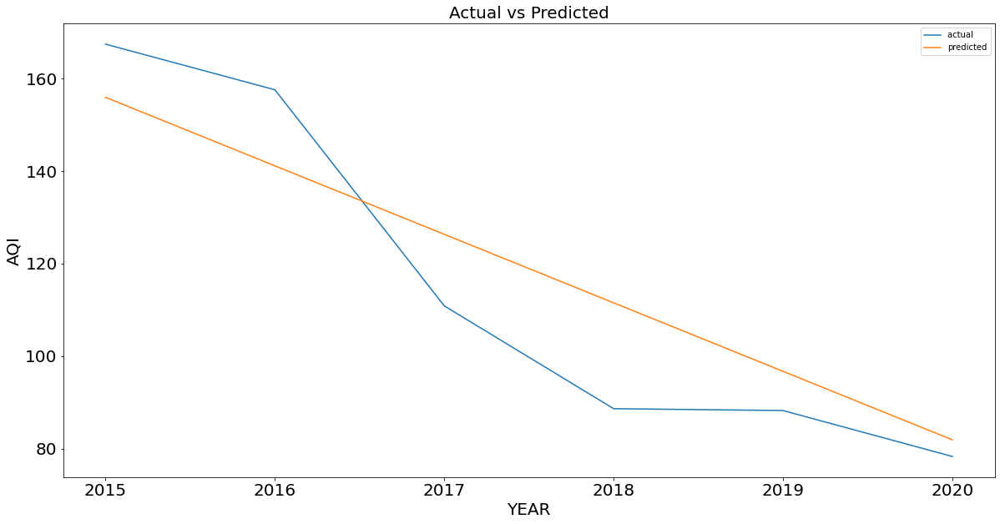

In [190]:
x_axis=x_af.Year
y_axis=x_af.Actual
y1_axis=x_af.Predicted
plt.plot(x_axis,y_axis)
plt.plot(x_axis,y1_axis)
plt.title("Actual vs Predicted",fontsize=20)
plt.legend(["actual ","predicted"])
plt.xlabel("YEAR",fontsize=20)
plt.ylabel("AQI",fontsize=20)
plt.tick_params(labelsize=20)
plt.show()

### 2. Calculating the AQI for each cities for upcoming years


In [191]:
city_day_pred = pd.read_csv("city_day_update.csv")

In [192]:
city_day_pred

,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,Air_quality
0,Ahmedabad,2015-01-01,48.485,95.71,0.92,18.22,17.15,15.80,0.92,27.64,133.36,1.07,0.02,0.96,118.0,Moderate
1,Ahmedabad,2015-01-02,48.485,95.71,0.97,15.69,16.46,15.80,0.97,24.55,34.06,3.68,5.50,3.77,118.0,Moderate
2,Ahmedabad,2015-01-03,48.485,95.71,17.40,19.30,29.70,15.80,17.40,29.07,30.70,6.80,16.40,2.25,118.0,Moderate
3,Ahmedabad,2015-01-04,48.485,95.71,1.70,18.48,17.97,15.80,1.70,18.59,36.08,4.43,10.14,1.00,118.0,Moderate
4,Ahmedabad,2015-01-05,48.485,95.71,22.10,21.42,37.76,15.80,22.10,39.33,39.31,7.01,18.89,2.78,118.0,Moderate
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29526,Visakhapatnam,2020-06-27,15.020,50.94,7.68,25.06,19.54,12.47,0.47,8.55,23.30,2.24,12.07,0.73,41.0,Good
29527,Visakhapatnam,2020-06-28,24.380,74.09,3.42,26.06,16.53,11.99,0.52,12.72,30.14,0.74,2.21,0.38,70.0,Satisfactory
29528,Visakhapatnam,2020-06-29,22.910,65.73,3.45,29.53,18.33,10.71,0.48,8.42,30.96,0.01,0.01,0.96,68.0,Satisfactory
29529,Visakhapatnam,2020-06-30,16.640,49.97,4.05,29.26,18.80,10.03,0.52,9.84,28.30,1.07,2.96,0.96,54.0,Satisfactory


In [193]:
# Finding unique cities available in dataset.
city_day_pred["City"].unique()

array(['Ahmedabad', 'Aizawl', 'Amaravati', 'Amritsar', 'Bengaluru',
       'Bhopal', 'Brajrajnagar', 'Chandigarh', 'Chennai', 'Coimbatore',
       'Delhi', 'Ernakulam', 'Gurugram', 'Guwahati', 'Hyderabad',
       'Jaipur', 'Jorapokhar', 'Kochi', 'Kolkata', 'Lucknow', 'Mumbai',
       'Patna', 'Shillong', 'Talcher', 'Thiruvananthapuram',
       'Visakhapatnam'], dtype=object)

In [194]:
# Finding count of unique rows of cities in the dataset.
city_day_pred["City"].value_counts()

Ahmedabad             2009
Delhi                 2009
Mumbai                2009
Bengaluru             2009
Lucknow               2009
Chennai               2009
Hyderabad             2006
Patna                 1858
Gurugram              1679
Visakhapatnam         1462
Amritsar              1221
Jorapokhar            1169
Jaipur                1114
Thiruvananthapuram    1112
Amaravati              951
Brajrajnagar           938
Talcher                925
Kolkata                814
Guwahati               502
Coimbatore             386
Shillong               310
Chandigarh             304
Bhopal                 289
Ernakulam              162
Kochi                  162
Aizawl                 113
Name: City, dtype: int64

**The AQI of India seems to vary sporadically between local regions but,as we saw, possesses a seasonal rally trend in the monsoon. For this reason,** *Prophet* **was chosen as it has excellent seasonality learning capabilities in time-series analaysis.**

#### I)  Forecasting Delhi's AQI for the upcoming years by using the dataset available

In [195]:
delhi =  city_day_pred[city_day_pred['City'] == 'Delhi']

In [196]:
delhi

,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,Air_quality
10229,Delhi,2015-01-01,313.22,607.98,69.16,36.39,110.59,33.85,15.20,9.25,41.68,14.36,24.86,9.84,472.0,Severe
10230,Delhi,2015-01-02,186.18,269.55,62.09,32.87,88.14,31.83,9.54,6.65,29.97,10.55,20.09,4.29,454.0,Severe
10231,Delhi,2015-01-03,87.18,131.90,25.73,30.31,47.95,69.55,10.61,2.65,19.71,3.91,10.23,1.99,143.0,Moderate
10232,Delhi,2015-01-04,151.84,241.84,25.01,36.91,48.62,130.36,11.54,4.63,25.36,4.26,9.71,3.34,319.0,Very Poor
10233,Delhi,2015-01-05,146.60,219.13,14.01,34.92,38.25,122.88,9.20,3.33,23.20,2.80,6.21,2.96,325.0,Very Poor
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12233,Delhi,2020-06-27,39.80,155.94,10.88,21.46,22.47,31.43,0.87,10.38,18.88,1.69,19.99,0.43,112.0,Moderate
12234,Delhi,2020-06-28,59.52,308.65,12.67,21.60,23.86,29.27,0.94,10.70,18.05,1.71,25.13,1.74,196.0,Moderate
12235,Delhi,2020-06-29,44.86,184.12,10.50,21.57,21.94,27.97,0.88,11.58,26.61,2.13,23.80,1.13,233.0,Poor
12236,Delhi,2020-06-30,39.80,91.98,5.99,17.96,15.44,28.48,0.84,10.51,37.29,1.57,16.37,0.49,114.0,Moderate


In [197]:
#Reducing the target dataset
delhi_aqi = delhi[['Date','AQI']]
delhi_aqi.reset_index(inplace = True,drop = True)

In [198]:
delhi_aqi

,Date,AQI
0,2015-01-01,472.0
1,2015-01-02,454.0
2,2015-01-03,143.0
3,2015-01-04,319.0
4,2015-01-05,325.0
...,...,...
2004,2020-06-27,112.0
2005,2020-06-28,196.0
2006,2020-06-29,233.0
2007,2020-06-30,114.0


In [199]:
#Training the model over the training data set by using Prophet(time series forecasting library)
train_df = delhi_aqi
train_df.rename(mapper = {'Date':'ds','AQI':'y'},axis =1,inplace = True)
train_df

m = Prophet(holidays_prior_scale=0,seasonality_prior_scale=20,n_changepoints= 50,daily_seasonality=True)
m.fit(train_df)

01:18:43 - cmdstanpy - INFO - Chain [1] start processing
01:18:44 - cmdstanpy - INFO - Chain [1] done processing


In [200]:
#Creating a future dataset
future = m.make_future_dataframe(periods=365)
future.tail()

,ds
2369,2021-06-27
2370,2021-06-28
2371,2021-06-29
2372,2021-06-30
2373,2021-07-01


In [201]:
# Predicting the future behaviour of AQI in Delhi
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
2369,2021-06-27,15.151967,-72.179657,107.341479
2370,2021-06-28,8.304171,-81.092528,98.563748
2371,2021-06-29,7.531971,-81.042863,95.885354
2372,2021-06-30,8.359923,-80.456249,92.903216
2373,2021-07-01,8.126453,-76.932192,108.591637


In [202]:
# Finding the Cross validation accuracy for getting the idea of our model how much it is accurate.
from prophet.diagnostics import mape,cross_validation,performance_metrics
df_cv = cross_validation(m, initial='1100 days', period='121 days', horizon = '365 days')
df_p = performance_metrics(df_cv)
print('Cross Validation accuracy:', (1 - df_p['mape'].mean())*100)

  0%|          | 0/5 [00:00<?, ?it/s]

01:18:56 - cmdstanpy - INFO - Chain [1] start processing
01:18:56 - cmdstanpy - INFO - Chain [1] done processing
01:19:06 - cmdstanpy - INFO - Chain [1] start processing
01:19:07 - cmdstanpy - INFO - Chain [1] done processing
01:19:16 - cmdstanpy - INFO - Chain [1] start processing
01:19:17 - cmdstanpy - INFO - Chain [1] done processing
01:19:25 - cmdstanpy - INFO - Chain [1] start processing
01:19:26 - cmdstanpy - INFO - Chain [1] done processing
01:19:36 - cmdstanpy - INFO - Chain [1] start processing
01:19:36 - cmdstanpy - INFO - Chain [1] done processing


Cross Validation accuracy: 67.97047760703944


**By using this model we are getting the accuracy of 67.97 for Delhi which is really good for using this model. This model can be used for predicting the trends in the AQI for Delhi of upcoming years.**

*Printing the trend of AQI in Delhi for upcoming years and finding the yearly, monthly, and weekly behaviour.*

In [203]:
# By this we get the upcoming trends for whole year.
# By this we can get an idea of monthly, daily and hourly behaviour also.
from prophet.plot import plot_plotly

fig = plot_plotly(m, forecast ,xlabel = 'Date',ylabel= 'AQI',figsize=(1000,750))

fig.show()

#### II)  Forecasting Patna's AQI for the upcoming years by using the dataset available

In [204]:
# Choosing only Patna city
patna =  city_day_pred[city_day_pred['City'] == 'Patna']

In [205]:
patna

,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,Air_quality
23864,Patna,2015-06-01,48.485,95.71,14.41,25.06,39.32,15.80,1.56,1.80,8.89,1.07,0.29,0.96,118.0,Moderate
23865,Patna,2015-06-02,48.485,95.71,25.00,22.48,47.50,15.80,2.35,9.69,9.90,0.08,0.83,0.09,118.0,Moderate
23866,Patna,2015-06-03,48.485,95.71,14.29,17.16,29.81,15.80,1.69,20.61,12.63,1.07,0.33,0.96,118.0,Moderate
23867,Patna,2015-06-04,48.485,95.71,13.03,15.62,28.63,15.80,1.20,4.35,9.77,0.01,0.28,0.96,118.0,Moderate
23868,Patna,2015-06-05,48.485,95.71,10.40,10.36,20.14,15.80,1.29,7.22,11.90,1.07,0.15,0.96,118.0,Moderate
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25717,Patna,2020-06-27,17.710,63.73,9.47,23.01,22.28,1.91,0.87,3.63,23.39,1.09,3.07,0.97,65.0,Satisfactory
25718,Patna,2020-06-28,19.270,57.42,30.19,18.13,36.76,2.05,0.72,3.92,17.37,1.18,2.90,1.24,82.0,Satisfactory
25719,Patna,2020-06-29,17.240,42.83,42.40,20.51,47.69,2.26,0.88,3.60,17.50,1.51,4.91,1.74,88.0,Satisfactory
25720,Patna,2020-06-30,29.760,60.68,42.12,27.50,52.04,1.59,0.83,3.91,21.70,1.58,8.59,2.02,93.0,Satisfactory


In [206]:
#Reducing target dataset
patna_aqi = patna[['Date','AQI']]
patna_aqi.reset_index(inplace = True,drop = True)

In [207]:
#Training the model over the training data set by using Prophet(time series forecasting library)
train_df = patna_aqi
train_df.rename(mapper = {'Date':'ds','AQI':'y'},axis =1,inplace = True)
train_df

m = Prophet(holidays_prior_scale=0,seasonality_prior_scale=20,n_changepoints= 50,daily_seasonality=True)
m.fit(train_df)

01:19:47 - cmdstanpy - INFO - Chain [1] start processing
01:19:48 - cmdstanpy - INFO - Chain [1] done processing


In [208]:
#Creating a future dataset.
future = m.make_future_dataframe(periods=365)
future.tail()

,ds
2218,2021-06-27
2219,2021-06-28
2220,2021-06-29
2221,2021-06-30
2222,2021-07-01


In [209]:
# Predicting the future behaviour of AQI in Patna.
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
2218,2021-06-27,11.754445,-62.226604,82.207675
2219,2021-06-28,8.512360,-67.814273,82.807106
2220,2021-06-29,13.255852,-59.275857,86.541985
2221,2021-06-30,13.006771,-59.560854,85.133394
2222,2021-07-01,9.804651,-63.738632,83.167927


In [210]:
# Finding the Cross validation accuracy for getting the idea of our model how much it is accurate.
from prophet.diagnostics import mape,cross_validation,performance_metrics
df_cv = cross_validation(m, initial='1100 days', period='121 days', horizon = '365 days')
df_p = performance_metrics(df_cv)
print('Cross Validation accuracy:', (1 - df_p['mape'].mean())*100)

  0%|          | 0/4 [00:00<?, ?it/s]

01:19:59 - cmdstanpy - INFO - Chain [1] start processing
01:19:59 - cmdstanpy - INFO - Chain [1] done processing
01:20:09 - cmdstanpy - INFO - Chain [1] start processing
01:20:10 - cmdstanpy - INFO - Chain [1] done processing
01:20:17 - cmdstanpy - INFO - Chain [1] start processing
01:20:17 - cmdstanpy - INFO - Chain [1] done processing
01:20:27 - cmdstanpy - INFO - Chain [1] start processing
01:20:28 - cmdstanpy - INFO - Chain [1] done processing


Cross Validation accuracy: 63.38596674035115


**By using this model we are getting the accuracy of 63.386 for Patna which is really good for using this model. This model can be used for predicting the trends in the AQI for Patna of upcoming years.**

*Printing the trend of AQI in Patna for upcoming years and finding the yearly, monthly, and weekly behaviour.*

In [211]:
# By this we get the upcoming trends for whole year.
# By this we can get an idea of monthly, daily and hourly behaviour also.
from prophet.plot import plot_plotly

fig = plot_plotly(m, forecast ,xlabel = 'Date',ylabel= 'AQI',figsize=(1000,750))

fig.show()

#### III)  Forecasting Bengaluru's AQI for the upcoming years by using the dataset available

In [212]:
# Choosing only Bengaluru city
bengaluru =  city_day_pred[city_day_pred['City'] == 'Bengaluru']

In [213]:
bengaluru

,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,Air_quality
4294,Bengaluru,2015-01-01,48.485,95.71,3.26,17.33,10.88,20.36,0.33,3.54,10.73,0.56,4.64,0.96,118.0,Moderate
4295,Bengaluru,2015-01-02,48.485,95.71,6.05,19.73,14.14,23.74,1.35,3.97,22.77,0.65,5.31,0.96,118.0,Moderate
4296,Bengaluru,2015-01-03,48.485,95.71,11.91,19.88,20.72,4.32,17.40,13.61,12.03,0.53,19.25,0.96,118.0,Moderate
4297,Bengaluru,2015-01-04,48.485,95.71,7.45,21.61,16.88,0.87,5.05,6.52,17.70,0.55,7.47,0.96,118.0,Moderate
4298,Bengaluru,2015-01-05,48.485,95.71,9.52,22.17,21.76,31.38,1.83,4.71,12.72,0.40,4.36,0.96,118.0,Moderate
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6298,Bengaluru,2020-06-27,16.600,29.48,3.06,13.68,13.07,6.88,0.67,7.29,15.69,0.21,1.18,0.96,51.0,Satisfactory
6299,Bengaluru,2020-06-28,20.440,26.34,2.69,10.33,10.58,6.58,0.66,6.60,17.59,0.12,0.94,0.96,61.0,Satisfactory
6300,Bengaluru,2020-06-29,28.680,29.27,3.62,12.12,12.94,6.80,0.56,6.33,16.99,0.17,1.17,0.96,65.0,Satisfactory
6301,Bengaluru,2020-06-30,14.470,24.26,4.61,12.69,15.00,6.82,0.56,6.45,16.08,0.18,0.86,0.96,63.0,Satisfactory


In [214]:
#Reducing target data_set
bengaluru_aqi = bengaluru[['Date','AQI']]
bengaluru_aqi.reset_index(inplace = True,drop = True)

In [215]:
#Training the model over the training data set by using Prophet(time series forecasting library)
train_df = bengaluru_aqi
train_df.rename(mapper = {'Date':'ds','AQI':'y'},axis =1,inplace = True)
train_df

m = Prophet(holidays_prior_scale=0,seasonality_prior_scale=20,n_changepoints= 50,daily_seasonality=True)
m.fit(train_df)

01:20:40 - cmdstanpy - INFO - Chain [1] start processing
01:20:40 - cmdstanpy - INFO - Chain [1] done processing


In [216]:
#Creating a future dataset.
future = m.make_future_dataframe(periods=365)
future.tail()

,ds
2369,2021-06-27
2370,2021-06-28
2371,2021-06-29
2372,2021-06-30
2373,2021-07-01


In [217]:
# Predicting the future behaviour of AQI in Bengaluru.
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
2369,2021-06-27,51.442944,8.732539,93.997069
2370,2021-06-28,51.458122,8.943406,94.890603
2371,2021-06-29,54.972129,9.719688,98.774818
2372,2021-06-30,54.693472,14.603014,99.555499
2373,2021-07-01,53.862229,11.849875,96.461272


In [218]:
# Finding the Cross validation accuracy for getting the idea of our model how much it is accurate.
from prophet.diagnostics import mape,cross_validation,performance_metrics
df_cv = cross_validation(m, initial='1100 days', period='121 days', horizon = '365 days')
df_p = performance_metrics(df_cv)
print('Cross Validation accuracy:', (1 - df_p['mape'].mean())*100)

  0%|          | 0/5 [00:00<?, ?it/s]

01:20:52 - cmdstanpy - INFO - Chain [1] start processing
01:20:53 - cmdstanpy - INFO - Chain [1] done processing
01:21:03 - cmdstanpy - INFO - Chain [1] start processing
01:21:03 - cmdstanpy - INFO - Chain [1] done processing
01:21:12 - cmdstanpy - INFO - Chain [1] start processing
01:21:13 - cmdstanpy - INFO - Chain [1] done processing
01:21:22 - cmdstanpy - INFO - Chain [1] start processing
01:21:23 - cmdstanpy - INFO - Chain [1] done processing
01:21:32 - cmdstanpy - INFO - Chain [1] start processing
01:21:33 - cmdstanpy - INFO - Chain [1] done processing


Cross Validation accuracy: 63.49849589422245


**By using this model we are getting the accuracy of 63.498 for Bengaluru which is really good for using this model. This model can be used for predicting the trends in the AQI for Bengaluru of upcoming years.**

*Printing the trend of AQI in Bengaluru for upcoming years and finding the yearly, monthly, and weekly behaviour.*

In [219]:
# By this we get the upcoming trends for whole year.
# By this we can get an idea of monthly, daily and hourly behaviour also.
from prophet.plot import plot_plotly

fig = plot_plotly(m, forecast ,xlabel = 'Date',ylabel= 'AQI',figsize=(1000,750))

fig.show()

#### IV)  Forecasting Chennai's AQI for the upcoming years by using the dataset available

In [220]:
# Choosing only Chennai city
chennai =  city_day_pred[city_day_pred['City'] == 'Chennai']

In [221]:
chennai

,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,Air_quality
7834,Chennai,2015-01-01,48.485,95.71,16.30,15.39,22.68,4.59,1.17,9.20,11.35,0.17,2.96,0.96,118.0,Moderate
7835,Chennai,2015-01-02,48.485,95.71,16.49,13.42,23.09,7.83,1.23,8.61,9.16,0.13,2.96,0.96,118.0,Moderate
7836,Chennai,2015-01-03,48.485,95.71,9.72,19.56,9.99,4.63,0.77,48.23,13.45,0.03,2.96,0.96,118.0,Moderate
7837,Chennai,2015-01-04,48.485,95.71,9.60,16.20,11.71,5.23,1.00,27.96,10.33,1.07,2.96,0.96,118.0,Moderate
7838,Chennai,2015-01-05,48.485,95.71,9.16,16.30,12.94,5.50,0.90,16.60,9.36,0.57,2.96,0.96,118.0,Moderate
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9838,Chennai,2020-06-27,26.420,39.30,7.25,12.96,19.59,33.20,1.10,7.29,68.51,0.10,0.07,0.96,95.0,Satisfactory
9839,Chennai,2020-06-28,25.930,45.54,7.81,10.00,16.39,35.98,0.76,6.48,77.45,0.09,2.96,0.96,98.0,Satisfactory
9840,Chennai,2020-06-29,21.300,22.21,7.65,9.69,16.74,34.07,0.96,6.62,62.57,0.09,0.01,0.96,104.0,Moderate
9841,Chennai,2020-06-30,24.140,30.66,8.42,12.38,20.29,34.17,1.05,7.50,68.75,0.17,0.16,0.96,110.0,Moderate


In [222]:
#Reducing target data_set
chennai_aqi = chennai[['Date','AQI']]
chennai_aqi.reset_index(inplace = True,drop = True)

In [223]:
#Training the model over the training data set by using Prophet(time series forecasting library)
train_df = chennai_aqi
train_df.rename(mapper = {'Date':'ds','AQI':'y'},axis =1,inplace = True)
train_df

m = Prophet(holidays_prior_scale=0,seasonality_prior_scale=20,n_changepoints= 50,daily_seasonality=True)
m.fit(train_df)

01:21:45 - cmdstanpy - INFO - Chain [1] start processing
01:21:46 - cmdstanpy - INFO - Chain [1] done processing


In [224]:
#Creating a future dataset.
future = m.make_future_dataframe(periods=365)
future.tail()

,ds
2369,2021-06-27
2370,2021-06-28
2371,2021-06-29
2372,2021-06-30
2373,2021-07-01


In [225]:
# Predicting the future behaviour of AQI in Chennai.
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
2369,2021-06-27,65.917531,4.447421,124.194548
2370,2021-06-28,63.813983,5.102808,127.140649
2371,2021-06-29,69.038115,15.507342,127.347812
2372,2021-06-30,73.645892,16.467333,135.093176
2373,2021-07-01,73.117267,14.157471,128.271758


In [226]:
# Finding the Cross validation accuracy for getting the idea of our model how much it is accurate.
from prophet.diagnostics import mape,cross_validation,performance_metrics
df_cv = cross_validation(m, initial='1100 days', period='121 days', horizon = '365 days')
df_p = performance_metrics(df_cv)
print('Cross Validation accuracy:', (1 - df_p['mape'].mean())*100)

  0%|          | 0/5 [00:00<?, ?it/s]

01:21:57 - cmdstanpy - INFO - Chain [1] start processing
01:21:57 - cmdstanpy - INFO - Chain [1] done processing
01:22:07 - cmdstanpy - INFO - Chain [1] start processing
01:22:07 - cmdstanpy - INFO - Chain [1] done processing
01:22:17 - cmdstanpy - INFO - Chain [1] start processing
01:22:17 - cmdstanpy - INFO - Chain [1] done processing
01:22:27 - cmdstanpy - INFO - Chain [1] start processing
01:22:28 - cmdstanpy - INFO - Chain [1] done processing
01:22:37 - cmdstanpy - INFO - Chain [1] start processing
01:22:37 - cmdstanpy - INFO - Chain [1] done processing


Cross Validation accuracy: 61.76724564183594


**By using this model we are getting the accuracy of 61.767 for Chennai which is really good for using this model. This model can be used for predicting the trends in the AQI for Chennai of upcoming years.**

*Printing the trend of AQI in Chennai for upcoming years and finding the yearly, monthly, and weekly behaviour.*

In [227]:
# By this we get the upcoming trends for whole year.
# By this we can get an idea of monthly, daily and hourly behaviour also.
from prophet.plot import plot_plotly

fig = plot_plotly(m, forecast ,xlabel = 'Date',ylabel= 'AQI',figsize=(1000,750))

fig.show()

## From the above examples of 4 cities, by using this model, we are getting a cross-validation accuracy above 60. This shows that we can implement this model for predicting or forecasting the behaviour of AQI in future for various cities across India.